In [43]:
pwd

'/home/asi/Desktop/GAB/testing'

In [1]:
import numpy as np
import tensorflow as tf
import json
from datetime import datetime
import os
import sys
sys.path.append('../')
import retriever
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  

/home/asi/anaconda3/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/asi/anaconda3/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [2]:
trainset_file = '../data/training/order_train_data.bin'
testset_file = '../data/training/order_test_data.bin'
vocab_file =  '../data/metadata/w2v_vocab.json'
params_dir_tmp = '../data/training/models/All/'
embed_path =  '../data/metadata/w2v.bin'

<h3>Each entry in this list has the following structure:</h3>
<ul>
<li>entry[0]: query indexes </li>
<li>entry[1:n]: n items where each item is [bounding box vector, bounding box spaital features]. Note that different enteries might have different 'n' </li>
<li>entry[n+1]: integer, entry[ 1 + entry[n+1]] is the ture bbox </li>
</ul>

In [3]:
trainset = np.load(open(trainset_file, 'rb'))
trainset = [item for item in trainset if len(item)>2 and len(item[0])>0]
print('trainset barches #:', len(trainset))

testset = np.load(open(testset_file, 'rb'))
testset = [item for item in testset if len(item)>2 and len(item[0])>0]
print('test barches #:', len(testset))

with open(vocab_file, 'r') as f:
    vocab = json.loads(f.read())

trainset barches #: 297
test barches #: 297


In [42]:
max([max([max(trainset[i][j][1][0][0]) for i in range(len(trainset))]) for j in range(11)])

24.10948

In [34]:
trainset[0][5][1][1][0]

array([-1.        , -0.8625    ,  0.99444444,  0.99583333, -0.00277778,
        0.06666667,  1.99444444,  1.85833333])

In [ ]:
trainset[0][5][1][1][0]

In [33]:
min(trainset[0][7][1][0][0])

0.0

In [4]:
vocab['<unk>'] = len(vocab)

In [5]:
len(vocab), vocab['<unk>']

(8242, 8241)

In [6]:
embed_vecs = np.load(open(embed_path, 'rb')).astype(np.float32)

<h3> augment_data function </h3>
<br>We try sevral regularization methods. One of the things I've tried is to add data points where for each data I pick a query from a random data point and a set of bbox from a different random point. We build the labels (bboxes) distribution by giving an equal probability to each label. <br><br>
The augment_data function does just that but the label of each added poind is writen as -1*number of bboxes. When we build the batch it self (function build_data in class Model), if we see a negative label index, we know its an added point and we know the number of bboxes so we can build the correct distribution.  

In [7]:
def augment_data(data, ratio=0.5, addNoise=False):
        '''
        The function add data points. 
        We pick a query from a random data point,
        and a set of bbox from a different random point and we join them
        to build a new data point. The label distribution of the new data point will 
        uniform, that is, all labels will have equal probability. 
        
        
        Params:
            data: a list of data entries
                                                
        Returns: a list of augmented data
            
                        
        '''
                          
        q_idx = np.random.choice(range(len(data)), int(len(data)*ratio), replace=False)
        im_idx = np.random.choice([i for i in range(len(data)) if i not in q_idx], int(len(data)*ratio))
        for i in range(len(q_idx)):
            q, im = data[q_idx[i]][0], data[im_idx[i]][1:-1]
            item = [q]
            for im_tmp in im:
                item.append(im_tmp)
            item.append(-len(im))
            data.append(item)

In [8]:
def stats(test, train, ephocs=100, title=None, params=[50, 100, 150, 200]):
    '''
    Plot metrics graphs and print some stats.
    
    Params:
        test: list. 
              Each item is a tuple, [test accuracy, test IOU, test loss]
        
        train: list. 
               Each item is a tuple, [train accuracy, train IOU, train loss, 0]
               For now we can ignore the last part in the tuple (zero)
               
        params: The hyper-parameters to iterate over, defult to number of rnn's hidden units.
    '''
    
    ephocs = range(ephocs)
    test_res = np.array(test)
    train_res = np.array(train)
    test_Glabels = ['test accuracy', 'test IOU', 'test loss']
    train_Glabels = ['train accuracy', 'train IOU', 'train loss']

    for j, param in enumerate(params):
        print('num_hidden:', num_hidden)
        print('='*(len('num_hidden:')+3))
        for i in range(len(train_Glabels)):
            plt.plot(ephocs, test_res[j][:,i])
            plt.plot(ephocs, train_res[j][:,i])
            plt.legend([test_Glabels[i], train_Glabels[i]], loc='upper left')
            if title is not None:
                plt.title('%s: %d'%(title, param))
            plt.show()

            metric = ''.join(train_Glabels[i][len('train')+1:])
            if metric=='loss':
                print('Train min %s:%.3f'%(metric, min(train_res[j][:,i])))
                print('Test min %s:%.3f'%(metric, min(test_res[j][:,i])))
            else:
                print('Train max %s:%.3f'%(metric, max(train_res[j][:,i])))
                print('Test max %s:%.3f'%(metric, max(test_res[j][:,i])))
        print('-'*100,'\n')

# ALSTM

This RNN cell has two LSTM cells, Bcell (for player B) and Acell (for Player A) and work as follow:
<ol> 
<li>We run B's cells with the true query input word, getting the un-edited state. If use_worsAttn=True we add attention on the images vectors for each word.</li>
<li>We run B's cells with the edited input word - 'unk', getting the edited state. If use_worsAttn=True we add attention on the images vectors for each word.</li>
<li>We feed the un-edited state to A's cell.</li>
<li>We run A's cells. A's input are:
<ul><li>B's un-edited state</li><li>The reward for editing a word</li><li>B's loss having no edited words.</li></ul></li>
<li>A's output is then goes throw a transformation which yields two values, one for editing a word and another for not.<br>If the the value for edit the word is higher, we pass B's edited state to the next time step, else we pass B's un_edit state.</li><br>
</ol>

In [9]:
class ALSTM(tf.nn.rnn_cell.LSTMCell):
    def __init__(self, 
                 batch_size, 
                 num_units, 
                 
                 # Size of A's attention vector.
                 words_attn_dim, 
                 # B's outputs (for each time step).
                 words_attn_states, 
                 # Inicates whether attentionvec is a padding (0) or not (1).
                 words_attn_idx, 
                 
                 # Size of B's attention vector ([image vector, spital features] size) .
                 img_attn_dim, 
                 # B's outputs (for each time step).
                 img_attn_states, 
                 
                 
                 # Inicates whether attentionvec is a padding (0) or not (1).
                 img_attn_idx, 
                 
                 unk, #'unk' word vector
                 
                 # Probabilty for edit a word in rnn, 
                 # when decision are taken randomly.
                 rnn_editProb, 
                 
                 
                 # Whehter to edit the query or not.
                 isEdit, 
                 
                 # Whether B uses words levlel attention or not.
                 use_wordAttn,
                 
                 # If True add noise instead of using 'unk'
                 useNoise=False,
                 
                 # If useNoise is true word vec = alpha*word_vector+(1-alpha)*noise
                 alpha=.3,
                 
                 # when isEdit=True, whether or not to use A's 
                 # output inorder to edit or to do it randomly.
                 activateA=False,
                 
                 #this holds A's rewards and B's losses to
                 # be add to A's feature vectors.
                 reward_loss=None,
                 state_is_tuple=True,):
        
        
        # When useing A, the cell state will contain the concatenation 
        # of both B and A states. Therefore we set the unit number to be
        # 2*(A and B unit size).
        super().__init__(2*num_units, state_is_tuple=state_is_tuple)
    
        self.words_attn_states = words_attn_states
        self.words_attn_idx = words_attn_idx
        self.words_attn_dim = words_attn_dim
        
        self.img_attn_states = img_attn_states
        self.img_attn_idx = img_attn_idx
        self.img_attn_dim = img_attn_dim
        
        self.num_units = num_units
        self.batch_size = batch_size
        self.unk = unk 
        self.isEdit = isEdit
        self.activateA = activateA
        self.use_wordAttn=use_wordAttn
        
        
        self.Acell = tf.nn.rnn_cell.LSTMCell(self.num_units, state_is_tuple=True)
        self.Bcell = tf.nn.rnn_cell.LSTMCell(self.num_units, state_is_tuple=True)
        
        self.rnn_editProb = rnn_editProb
        self.reward_loss = reward_loss
        self.useNoise=useNoise
        self.alpha=alpha
        

    def call(self, inputs, state):
        '''
        Params:
            inputs: word embadding.
            state:  [B's state form privious state, A's state form privious state]
        '''
        # takse B's state from state[:self.num_units]
        Bstate_c = tf.slice(state[0], [0, 0], [-1, self.num_units])
        Bstate_h = tf.slice(state[1], [0, 0], [-1, self.num_units])
        self.Bstate =  tf.nn.rnn_cell.LSTMStateTuple(c=Bstate_c, h=Bstate_h)
         
        # If B's cell uses attention
        if self.use_wordAttn:
            words_attn = self.attention(Bstate_h, self.img_attn_states, self.img_attn_dim, self.img_attn_idx)
            new_input = tf.concat([inputs, words_attn], -1)
            Boutputs, Bnew_state =  self.Bcell(new_input, self.Bstate, 'Bcell')
        else:
            Boutputs, Bnew_state =  self.Bcell(inputs, self.Bstate, 'Bcell')

        
        # If isEdit==True 
        def f1(): 
            # takse A's state from state[self.num_units: 2*self.num_units]
            Astate_c = tf.slice(state[0], [0, self.num_units], [-1, self.num_units])
            Astate_h = tf.slice(state[1], [0, self.num_units], [-1, self.num_units])
            self.Astate =  tf.nn.rnn_cell.LSTMStateTuple(c=Astate_c, h=Astate_h)
            
            if self.useNoise: # just add noise to the edited words
                new_unk_vecs = self.alpha*inputs + (1-alpha)*tf.random_normal(shape=inputs.get_shape(), stddev=0.1)
            else: # change the edited words by 'unk'
                unk_vecs = tf.concat([self.unk for _ in range(self.batch_size)], 0) # shape: self.batch_size x 1 x embed_size
                new_unk_vecs = tf.squeeze(unk_vecs) # shape: self.batch_size x embed_size
            
            # run B's cell with unk_batch
            if self.use_wordAttn:
                new_unk = tf.concat([new_unk_vecs, words_attn], -1)
            else:
                new_unk = new_unk_vecs
            edit_output, edit_new_state = self.Bcell(new_unk, self.Bstate, 'Bcell')  
            out1, state1 = self.runCell(Boutputs, Bnew_state, edit_new_state)
            return out1, state1
        
        def f2(): 
            outs = tf.concat([Boutputs, tf.zeros((self.batch_size, self.num_units))], 1)
            new_state_c = tf.concat([Bnew_state[0], tf.zeros_like(Bnew_state[0])], 1)
            new_state_h = tf.concat([Bnew_state[1], tf.zeros_like(Bnew_state[1])], 1)
            return outs, tf.nn.rnn_cell.LSTMStateTuple(c=new_state_c, h=new_state_h)
        
        new_output, new_state = tf.cond(self.isEdit, f1, f2)
        
        return new_output, new_state
    
    def runCell(self, Boutputs, Bnew_state, edit_new_state):
        '''
        Run B's cell after editing.
        
        params:
            Boutputs: output vector without editing.
            Bnew_state: state vector without editing.
            edit_new_state: state vector after editing the input word to 'unk'. 
        '''
        
        with tf.variable_scope('runcell'):
            # get action values according to B's hidden state
            Aout, Anew_state, actions_vals = self.action_vals(Boutputs) 
            
            def f1(): 
                '''
                If self.activateA==True, edit word if actions_vals[0]<actions_vals[1].
                Note: if we edit the word cond=1, else cond=0.
                '''
                a1, a2 = tf.split(value=actions_vals, num_or_size_splits=2, axis=1)
                cond = tf.less(a1, a2)
                return cond

            def f2(): 
                '''
                If self.activateA==False, choose randomly whether to edit a word.
                We edit a word with 'rnn_editProb' probability (~U[0,1]).
                Note: if we edit the word cond=1, else cond=0.
                '''
                rand = tf.multinomial(tf.log([[self.rnn_editProb, 1-self.rnn_editProb]]), self.batch_size)
                cond = tf.less(tf.transpose(rand), 1) 
                return cond

            # a list of A's decisions for each batch.  1->edit, 0-> do not edit.
            cond = tf.cast(tf.cond(self.activateA, f1, f2), tf.float32)

            # We'd like to know the action values and decision for each word,
            # therefore theses info are placed on the first 3 dimensions of the 
            # output vector. Note that this vector is not passed to the 
            # next tiee step so it won't affect the model. 
            outs = tf.concat([actions_vals, cond], 1)

            # B's i state is replaced by the edited state if cond[i]=1 (i =1, 2, ..., batch_size)
            new_edit_state_c = (1-cond)*Bnew_state[0] + cond*edit_new_state[0]
            new_edit_state_h = (1-cond)*Bnew_state[1] + cond*edit_new_state[1]


            new_outs = tf.concat([outs, tf.zeros((self.batch_size, 2*self.num_units-3))], 1)
            new_state_c = tf.concat([new_edit_state_c, Anew_state[0]], 1)
            new_state_h = tf.concat([new_edit_state_h, Anew_state[1]], 1)
            return new_outs, tf.nn.rnn_cell.LSTMStateTuple(c=new_state_c, h=new_state_h)
    
    
    def action_vals(self, Boutputs):
        '''
        Get values for editing/not editing the input word.
        
        Params:
            Boutputs: output vector without editing.
            
        Returns vals where:
            Aout: A's cell output
            Anew_state: A's cell state
            vals: Tensor where vals[0] is the value for not editing the word 
                    and vals[1] is the value for editing the word.
        '''
        
        with tf.variable_scope('action_vals') as scope:
            Aattn = self.attention(self.Astate[1], self.words_attn_states, self.words_attn_dim, self.words_attn_idx)
            
            # A's input: [input, B's output, attntion state, reward, B's loss with no edits]
            Anew_inputs = tf.concat([Boutputs, Aattn, self.reward_loss], 1)
            
            Aout, Anew_state = self.Acell(Anew_inputs, self.Astate, 'Acell')
            vals = tf.nn.relu(self.linear(Aout, 2))

            # Save the variables that only A uses. 
            # These variables will be trained separately from B's model.
            self.Avars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=scope.name)
            
            return Aout, Anew_state, vals
            
        
    def linear(self, inputs, output_dim, scope='linear', bias=True, reuse=False):
        with tf.variable_scope(scope, reuse=False):
            W = tf.get_variable('W', initializer=tf.random_uniform_initializer(maxval=1., minval=-1.),
                                shape=(inputs.get_shape()[-1], output_dim))
            if bias:
                b = tf.get_variable('b', initializer=tf.constant_initializer(0.1),
                               shape=[1, output_dim])
                return tf.matmul(inputs, W) + b

        return tf.matmul(inputs, W)
    
    
    def attention(self, state, attn_states, attn_dim, attn_idx, relu=False):
        '''
        Attention mechanism (see https://arxiv.org/pdf/1409.0473.pdf)
        
        state: State from previous time step.
        attn_states: Attetntion states. 
                     Tensor of shape (batch_size x max([len(attention_vectors[i]) for i in range(bach_size)]) x attn_dim)
        attn_dim: Attention vector size.
        attn_idx,: Tensor used for masking of shape (batch_size x max([len(attention_vectors[i]) for i in range(bach_size)]). 
                   attn_idx[i, j]=1 if the j's attention vcctior of sample i  is not padding, else its equat to 0.
        '''
        
        self.attn_length = tf.shape(attn_states)[1]  
        
        # Computing... hidden_attn = W*v_att (use tf.nn.conv2d for efficiency)
        attn_vecs = tf.reshape(attn_states, [self.batch_size, self.attn_length, 1, attn_dim])
        W = tf.get_variable("attn_W", [1, 1, attn_dim, self.num_units])
        hidden_attn = tf.nn.conv2d(attn_vecs, W, [1, 1, 1, 1], "SAME")

        # Computing... hidden_s = U*v_state
        hidden_s = tf.reshape(
            self.linear(
                tf.cast(state, tf.float32), output_dim=self.num_units, scope='hidden_s_linear'), [-1, 1, 1,  self.num_units], name='hidden_s')

        # Computing alpha
        v = tf.get_variable("attn_v", [self.num_units])
        if relu:
            logits = tf.reduce_sum(v * tf.nn.relu(hidden_attn + hidden_s), [2, 3])
        else:
            logits = tf.reduce_sum(v * tf.nn.tanh(hidden_attn + hidden_s), [2, 3])

        # Masked softmax
        max_logits = tf.reduce_max(logits, axis=-1)
        masked_logits = tf.exp(logits-tf.expand_dims(max_logits, axis=1))*attn_idx
        alpha = masked_logits/tf.reduce_sum(masked_logits, axis=-1, keep_dims=True)

        a = tf.reduce_sum(tf.reshape(alpha, [-1, self.attn_length, 1, 1]) * attn_vecs, [1, 2])
        b = tf.contrib.layers.fully_connected(a, num_outputs=self.num_units)
                                               

        return b

# Training
When A joins the game, each iteration is completed via three steps:
<ul>
<li>We feed the query as it is to B and run it alone (no optimization nor training is done in this step)</li>
<li>We run A and B together (no optimization nor training is done in this step). At this step we get A's decition and B's loss on the edited query. We use B's loss to calculate the Bellman's value for each time step. </li>
<li>We again run A and B together, since now we know the real values for each time step and the real action for each time step (these will be the same as in the previous step since we did not train optimize the parameters yet), we finaly train the model</li>
</ul>
<br>
But first we check the model's performance with out A. Class Model has a set of conditioning variables that set a different ragularization methods in the model. We start by checking them with out A's interference. We can also make the model RNN become bidirectional (by setting useBidirectionalRnn to True) and use words level attention (by setting use_wordAttn to True).

In [10]:
class Model():
    def __init__(self,
                 batch_size, 
                 num_hidden, 
                 
                 #Image's vector size.
                 img_dims, 
                 
                 #Spaital features length.
                 bbox_dims, 
                 
                 #Probabilty for edit a word in rnn, when decision are taken randomly.
                 rnn_editProb,  
                 vocab, 
                 lr, #  B's learning rate.
                 decay_steps, 
                 decay_rate, 
                 
                # coefficient to multiply the reward by when editing a word.
                 edit_reward,
                 
                 # A's leanring rate = B's learning rate x coefAlr.
                 coefAlr,
                 
                 # whether to use bach normaliztion for the last attention layer
                 bnorm,
                 embed_size=embed_vecs.shape[1],
                 # Whether B uses words levlel attention or not.
                 use_wordAttn=False,
                 
                 # Whther to use bidirectional rnn
                 useBidirectionalRnn=False):
#         with tf.device('/cpu:0'):
        self.batch_size = batch_size
        self.img_dims = img_dims
        self.bbox_dims = bbox_dims 
        self.num_hidden = num_hidden
        self.embed_size = embed_size
        self.vocab = vocab
        L2Reg = 0.0005 # L2 regulizerr coefficient
        self.lr = lr


        self.queries = tf.placeholder(tf.int32, [None, None], name='queries')
        self.img  = tf.placeholder(tf.float32, [None, None, self.img_dims], name='img')# VGG output vectors
        self.bboxes = tf.placeholder(tf.float32, [None, None, self.bbox_dims], name='bboxes')# spatial bbox's features.

        # attn_idx: inicates whether attention box is a dummy (0) or not (1).
        self.attn_idx = tf.placeholder(tf.float32, [None, None], name='attn_idx')

        self.labels = tf.placeholder(tf.float32, [None, None], name='labels')
        self.isEdit = tf.placeholder(tf.bool, name='isEdit') # whehter to edit the query or not.

        # when isEdit=True, whether to use A's output in order to edit or to do it randomly.
        self.activateA = tf.placeholder(tf.bool, name='activateA') 


        # this holds  A's rewards and B losses to be add to A's feature vectors.
        self.reward_loss = tf.placeholder(tf.float32, [None,2], name='rewards_loss')

        # Dropout ratio for rnn's inputs and outpouts
        self.dropout_in = tf.placeholder(tf.float32, name='dropoutIn_holder')
        self.dropout_out = tf.placeholder(tf.float32, name='dropoutOut_holder')

        # Dropout ratio for attention vector (for the final attention layer before the loss function)
        self.dropout_img = tf.placeholder(tf.float32, name='dropoutImg_holder')
        # Dropout ratio for query vector (for the final attention layer before the loss function)
        self.dropout_q = tf.placeholder(tf.float32, name='dropoutImg_holder')

        # B outputs vectors (with no words edits), These are A's attention vectors
        # which it uses to decide whter to edit a word.
        self.Aattn_vecs = tf.placeholder(tf.float32, [None, None, None], name='Aattn_vecs_holder')    
        self.unk = tf.constant([[vocab['<unk>']]], tf.int32)

        self.isTrain = tf.placeholder(tf.bool, name='isTrain_holder') 
        self.queries_lens = self.length(self.queries) # list of all the lengths  of the batch's queriey 

        # Concatinate images vectors and their spaital features. 
        # These vectors wlll be used for attenionn when 
        # we calculate the loss function.
        attn_vecs = tf.concat([self.img, self.bboxes], 2) 
        voc_size = len(self.vocab)

        # Load pre-trained word imaddings.
        # w2v_embed is not trainable.
        with tf.variable_scope('w2v'):
            w2v_embed = tf.get_variable('w2v_embed', initializer=embed_vecs, trainable=False)
            w2v_queries = tf.nn.embedding_lookup(w2v_embed, self.queries, name='w2v_queries')

        with tf.variable_scope('embed'):
            embed = tf.get_variable('embed', shape=[voc_size, self.embed_size], 
                                    initializer=tf.random_uniform_initializer(minval=-0.1, maxval=0.1))
            embed_queries_tmp = tf.nn.embedding_lookup(embed, self.queries, name='embed_queries')

        embed_queries = embed_queries_tmp+w2v_queries

        with tf.variable_scope('rnn'):
            Aattn_idx = tf.cast(tf.abs(tf.sign(self.queries)), tf.float32)


            cell_tmp = ALSTM(num_units=self.num_hidden, 
                            words_attn_dim=self.num_hidden, 
                            words_attn_states=self.Aattn_vecs, 
                            words_attn_idx=Aattn_idx,
                            img_attn_dim=self.img_dims+self.bbox_dims,
                            img_attn_states=attn_vecs,
                            img_attn_idx=self.attn_idx,
                            batch_size=self.batch_size, 
                            unk=tf.nn.embedding_lookup(embed, self.unk), rnn_editProb=rnn_editProb,
                            activateA=self.activateA, isEdit=self.isEdit,
                            reward_loss=self.reward_loss, use_wordAttn=use_wordAttn)

            cell = tf.nn.rnn_cell.DropoutWrapper(
                cell_tmp, input_keep_prob=self.dropout_in, output_keep_prob=self.dropout_out)

            if useBidirectionalRnn:
                self.outputs, self.last_states = tf.nn.bidirectional_dynamic_rnn(
                    cell_fw=cell,
                    cell_bw=cell,
                    dtype=tf.float32,
                    sequence_length=self.queries_lens,
                    inputs=embed_queries)

                # self.last_states contain both forward state
                # and backward state.
                # We don't use A with bidirectional rnn
                # so no need for self.values (action values as calculated by A)
                Bstate = tf.concat(
                    [tf.slice(self.last_states[0][1], [0,0], [-1, self.num_hidden]), 
                     tf.slice(self.last_states[1][1], [0,0], [-1, self.num_hidden])], -1)
            else:
                self.outputs, self.last_states = tf.nn.dynamic_rnn(
                    cell=cell,
                    dtype=tf.float32,
                    sequence_length=self.queries_lens,
                    inputs=embed_queries)

                # self.values[0]=value for not editing, self.values[1]=value for editing
                self.values = tf.slice(self.outputs, [0,0,0], [-1,-1,2])
                Bstate = tf.slice(self.last_states[1], [0,0], [-1, self.num_hidden])  


        Avars = cell_tmp.Avars
        self.Avars = {var.name:var for var in Avars}

        if bnorm:
            self.scores = self.bnorm_attention(Bstate) 
        else:
            self.scores = self.attention(Bstate) 


        # Cross entophy loss for each of the queries in the batch.
        self.B_ce = -tf.reduce_sum(
                        self.labels*tf.log(self.scores+0.00000001)+
                            (1-self.labels)*tf.log((1-self.scores)+0.00000001), 
                            axis=-1)


        # We don't use A with bidirectional rnn
        if not useBidirectionalRnn:
            # A's decision for each word.
            self.idx = tf.squeeze(tf.slice(self.outputs, [0,0,2], [-1,-1,1]))

            self.edit_num = tf.reduce_mean(tf.reduce_sum(
                tf.cast(self.idx, tf.float32)*tf.expand_dims(
                        1/tf.cast(self.queries_lens, tf.float32), axis=1), axis=1))

            # After running A for the first time, we get A's decisions and their values.
            # we then calulate the following tensors:
            # actions_idx[j,i] = 1 if the word i in query j was edited or 0 otherwise.     
            # bell_vall holds the values for each decision by the bellman function. 

            #  self.actions_idx will be used to get the values of the action that were taken by A.                 
            self.actions_idx = tf.placeholder(shape=[None, None], dtype=tf.int32, name="actions_idx")
            self.bell_val = tf.placeholder(shape=[None, None], dtype=tf.float32, name="bell_val")

            # pyrite_val: holds the values for each of A's decisions, claculated by A. 
            # see https://en.wikipedia.org/wiki/Pyrite.
            self.pyrite_val = tf.reshape(tf.gather_nd(tf.reshape(self.values, (-1,2)), self.actions_idx), (self.batch_size, -1))

            # RMSE loss
            self.A_loss = tf.reduce_mean(tf.reduce_sum(
                tf.sqrt(tf.square((self.bell_val-self.pyrite_val+0.000001)*tf.cast(
                    tf.sign(tf.abs(self.queries)), tf.float32)))/tf.expand_dims(
                                                    tf.cast(self.queries_lens, tf.float32), axis=1), axis=-1))

        self.B_loss = tf.reduce_mean(self.B_ce)

        ##############
        # Optimizers #
        ##############

        starter_learning_rate = self.lr
        self.global_step = tf.Variable(0, name='global_step', trainable=False)
        self.learning_rate = tf.train.exponential_decay(starter_learning_rate, self.global_step,
                                                       decay_steps=decay_steps, decay_rate=decay_rate, staircase=True)

        if not useBidirectionalRnn:
            # Train only A variables 
            self.A_optimizer =  tf.train.GradientDescentOptimizer(
                    learning_rate=coefAlr*self.learning_rate).minimize(self.A_loss, var_list=Avars)  

        # Train only B variables 
        Bvars = [var for var in tf.trainable_variables() if var not in Avars]
        self.B_optimizer =  tf.train.GradientDescentOptimizer(
                    learning_rate=self.learning_rate).minimize(self.B_loss, global_step=self.global_step, var_list=Bvars)  

        if not os.path.exists(params_dir):
                os.makedirs(params_dir)
        self.saver = tf.train.Saver()

        
    def length(self, seq):
        '''
        Retruns real lengths (before addings) of all queries in seq  .
        '''
        return tf.cast(tf.reduce_sum(tf.sign(tf.abs(seq)), reduction_indices=1), tf.int32)
       

    def linear(self, inputs, output_dim, scope='linear', bias=True, reuse=False):

        with tf.variable_scope(scope, reuse=reuse):
            W = tf.get_variable('W', initializer=tf.contrib.layers.xavier_initializer(),
                                shape=(inputs.get_shape()[-1], output_dim))
            if bias:
                b = tf.get_variable('b', initializer=tf.constant_initializer(0.1),
                               shape=[1, output_dim])
                return tf.matmul(inputs, W) + b
            
            return tf.matmul(inputs, W)

            
    def attention(self, q_embed):
        '''
        Given B's output vector, calculate the attention over 
        all the query's bounding boxes vectors, That is, calculate:
        
        probs = softmax(relu(context(Sq+Satt+b)))
        
        Where:
        Sq = <Wq, queries_states>
        Sattn = <Wattn, attention_bboxes_vectors>
        
        The  bounding box with the highest attention score will be chosen as the correct bounding box.
        
        Params:
            q_embed: Tensor of shape (batch size x num_hidden)B's outputs. 
            
        Returns:
            probs: Tensor of shape (batch_size x max bbox number for query).
                   Attention score for each bbox.
        '''
        # concatenate img vectors with with spaical features
        attn_vecs = tf.concat([self.img, self.bboxes], 2)
        
        # B's outputs, shape: (batch size x num_hidden)
        Urnn = q_embed
        
        # Attention vectors, 
        # shape: (batch size x max bbox number for query x attention vector size)
        Uatt = attn_vecs
           
        with tf.variable_scope('l1'):
            b = tf.get_variable(
                    'b', 
                    initializer=tf.constant_initializer(0.1), 
                    shape=[1, self.num_hidden])

            context = tf.get_variable(
                    'context', 
                    initializer=tf.random_uniform_initializer(minval=-0.1, maxval=0.1), 
                    shape=[self.num_hidden, 1])


            Sq = tf.nn.dropout(
                self.linear(Urnn, self.num_hidden, bias=False, scope='Sq'), 
                self.dropout_q)
            
            Sattn = tf.nn.dropout(
                tf.reshape(
                    self.linear(
                        tf.reshape(Uatt, (-1, self.img_dims+self.bbox_dims)), 
                        self.num_hidden, 
                        bias=False, scope='Sattn'), 
                    [self.batch_size, -1, self.num_hidden]),
                self.dropout_img)

        out = tf.nn.relu(tf.expand_dims(Sq, 1) + Sattn + b)
        logits = tf.reshape(tf.matmul(tf.reshape(out, (-1, tf.shape(out)[-1])),  context), (tf.shape(out)[0], -1))

        # Calculate logits's masked softmax (we use self.attn_idx to mas
        max_logits = tf.reduce_max(logits, axis=-1)
        masked_logits = tf.exp(logits-tf.expand_dims(max_logits, axis=1))*self.attn_idx
        probs = self.attn_idx*masked_logits/tf.reduce_sum(masked_logits, axis=-1, keep_dims=True)

        return probs

    
    def bnorm_attention(self, q_embed):
        '''
        Given B's output vector, calculate the attention over 
        all the query's bounding boxes vectors, That is, calculate:
        
        probs = softmax(relu(context(Sq+Satt+b)))
        
        Where:
        Sq = <Wq, queries_states>
        Sattn = <Wattn, attention_bboxes_vectors>
        
        The  bounding box with the highest attention score will be chosen as the correct bounding box.
        This function uses batch normalization. 
        
        Params:
            q_embed: Tensor of shape (batch size x num_hidden)B's outputs. 
            
        Returns:
            probs: Tensor of shape (batch_size x max bbox number for query).
                   Attention score for each bbox.
        '''
        # concatenate img vectors with with spaical features
        attn_vecs = tf.concat([self.img, self.bboxes], 2)
        
        # B's outputs with bath normalization. 
        # shape: (batch size x num_hidden)
        Urnn = tf.contrib.layers.batch_norm(
            q_embed, center=True, scale=True, is_training=self.isTrain) 
        
        # Attention vectors with bath normalization. 
        # shape: (batch size x max bbox number for query x attention vector size)
        Uatt = tf.contrib.layers.batch_norm(
            attn_vecs, center=True, scale=True, is_training=self.isTrain)
           
        update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
        with tf.control_dependencies(update_ops):
            with tf.variable_scope('bnorm_l1'):
                b = tf.get_variable(
                        'b', 
                        initializer=tf.constant_initializer(0.1), 
                        shape=[1, self.num_hidden])

                context = tf.get_variable(
                        'context', 
                        initializer=tf.random_uniform_initializer(minval=-0.1, maxval=0.1), 
                        shape=[self.num_hidden, 1])


                Sq = tf.nn.dropout(
                    self.linear(Urnn, self.num_hidden, bias=False, scope='Sq'), 
                    self.dropout_q)
                
                Sattn = tf.nn.dropout(
                            tf.reshape(
                                self.linear(
                                    tf.reshape(Uatt, (-1, self.img_dims+self.bbox_dims)), 
                                    self.num_hidden, 
                                    bias=False, scope='Sattn'), 
                                 [self.batch_size, -1, self.num_hidden]),
                            self.dropout_img)
                    
                   
            out = tf.nn.relu(tf.expand_dims(Sq, 1) + Sattn + b)
            logits = tf.reshape(tf.matmul(tf.reshape(out, (-1, tf.shape(out)[-1])),  context), (tf.shape(out)[0], -1))

            # Calculate logits's masked softmax (we use self.attn_idx to mas
            max_logits = tf.reduce_max(logits, axis=-1)
            masked_logits = tf.exp(logits-tf.expand_dims(max_logits, axis=1))*self.attn_idx
            probs = self.attn_idx*masked_logits/tf.reduce_sum(masked_logits, axis=-1, keep_dims=True)

            return probs
  
        
    def q_padding(self, seq, max_length):
        '''
        Pad  seq with vocab['<pad>'] (0) to max_length length.
        '''                  
        return seq + [self.vocab['<pad>']]*(max_length-len(seq))

    
    def build_data(self, data, start, end, imScale, addNoise=False):
        '''
        Build batch.
        ------------
        
        Params:
            data: each entry in this list has the following structure:
                  [query indexes, [bounding box vector (VGG), bounding box spaital features], ..., 
                  [bounding box vector (VGG), bounding box spaital features], index of the true label]
                  
            start/end: batch data is built from data[start:end]
            
        Returns:
            attn_idx: attn_idx[i, j]=1 if the j'th bbox in the i'th query is not padding, else equals to 0. 
            
            padded_queries: list of queries, padded to the length of the longest query in the batch.
                            Note: vocab['pad']=0
                            
            padded_im: list of bounding boxes vectors, padded to the maximum number of bbox per query.
                       Note: padded vector is vector of zeros. 
                            
            padded_bbox: list of bounding boxes spatial features, padded to the maximum number of bbox per query.
                         Note: padded vector is vector of zeros.  
        
            onehot_labels: onehot_labels[i][j]=1 if j is the true bbox for query i, else  onehot_labels[i][j]=0
            
            addNoise: Boolean. Whether to add normal noise to the images.
            
            imScale: If not None, scale the image vectors (VGG16 outputs) to have 0 mean and 1imScale std
                        
        '''
                          
        qlen = max([len(data[i][0]) for i in range(start, end)]) # Length fo the longest query
        imlen = max([len(data[i]) for i in range(start, end)])-2 # Maximum number of bbox per query.
        padded_queries, padded_im, padded_bbox, attn_idx = [], [], [], []
        
        # Build one hot labels from the labels index, given in the data.                  
        labels = [item[-1] for item in data[start:end]] #data[i][-1]=index of the true bbox of query i
        dist_labels = np.zeros((end-start, imlen)) #label distribution
        
        # Real data points
        dist_labels[[i for i in np.arange(end-start) if labels[i]>0], [l for l in labels if l>0]]=1
        
        # augmented data points
        for i in np.arange(end-start):
            if labels[i]<0:
                dist_labels[i] = [-1/labels[i] for _ in range(-labels[i])]+[0. for _ in range(imlen+labels[i])]
                          
        im_dim, bbox_dim = data[0][1][0].shape[1], data[0][1][1].shape[1]
        for i in range(start, end):
            padded_queries.append(self.q_padding(data[i][0], qlen))
            
            attn_idx.append([1 for _ in range(len(data[i])-2)]+[0 for _ in range(imlen-(len(data[i])-2))])
            
            padded_im.append(np.concatenate([data[i][j][0] for j in range(1, len(data[i])-1)] + 
                                       [np.full((imlen-(len(data[i])-2), im_dim), vocab['<pad>'], dtype=np.float32)], axis=0))
            
            padded_bbox.append(np.concatenate([data[i][j][1] for j in range(1, len(data[i])-1)] + 
                                       [np.full((imlen-(len(data[i])-2),bbox_dim), vocab['<pad>'], dtype=np.float32)], axis=0))
           
        
        
        if addNoise:
            padded_im+=(padded_im+np.random.normal(0, .1, np.array(padded_im).shape))*np.expand_dims(attn_idx, 2)
        else:
            padded_im=np.array(padded_im)
            
        if imScale is not None:
            # Smoothing factor
            halper = (1-np.expand_dims(np.array(attn_idx).astype(np.float32), 2))
            img_min = np.min(padded_im, axis=-1, keepdims=True)
            img_max = np.max(padded_im, axis=-1, keepdims=True)
            img_scale = (padded_im-img_min)/((img_max-img_min)+halper) # Scale to 0-1
            s = np.std(img_scale, axis=-1, keepdims=True)
            padded_im = img_scale/(imScale*s+halper)  #Scale to have 1/imScale std
            padded_im = padded_im - np.mean(padded_im, axis=-1, keepdims=True) # scale to zero mean
            
        return np.array(attn_idx), np.array(padded_queries, dtype=np.int32), padded_im, np.array(padded_bbox), np.array(dist_labels)
            
   
    def ground(self, data=None, start=None, end=None, sess=None, feed_dict = None, isEdit=True, imScale=False):
        '''
        Given a query and a list of bboxes, the function returns the index of the referred bbox.
        '''
        isSess = (sess==None)
        if isSess:
            sess = tf.Session()
        with sess.as_default():
            if isSess:
                tf.global_variables_initializer().run()
                ckpt = tf.train.get_checkpoint_state(params_dir)
                if ckpt and ckpt.model_checkpoint_path:
                    self.saver.restore(sess, ckpt.model_checkpoint_path) # restore all variables
                else:
                    print('Initializing variables')
            if feed_dict is None:
                attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(data, start, end, imScale=imScale)
                feed_dict = {
                        self.queries:padded_queries,
                        self.img:padded_im,
                        self.bboxes:padded_bbox,
                        self.labels:labels,
                        self.attn_idx:attn_idx
                    }
            feed_dict[self.isTrain]=False
            feed_dict[self.isEdit] = isEdit
            feed_dict[self.dropout_in]=1.
            feed_dict[self.dropout_out]=1.
            feed_dict[self.dropout_img]=1.
            feed_dict[self.dropout_q]=1.
            scores = sess.run(self.scores, feed_dict=feed_dict) # get score for each bbox

        return np.argmax(scores, axis=1), np.argmax(feed_dict[self.labels], axis=1)
        
        
    def iou_accuracy(self, data, start, end, imScale, sess=None, feed_dict = None, threshold=0.5, test=False, isEdit=True):
        '''
        Calculate the IOU score between the Model bbox and the true bbox.
        ''' 
                          
        # Get score for each bbox (labels) and th true bbox index (gt_idx)                  
        if feed_dict is None:
            labels, gt_idx = self.ground(data, start, end, sess=sess, feed_dict=feed_dict, 
                                         isEdit=isEdit, imScale=imScale)
        else: labels, gt_idx = self.ground(sess=sess, feed_dict=feed_dict, 
                                           isEdit=isEdit, imScale=imScale)
        acc = 0
        
        for i in range(start, end):
            gt = data[i][gt_idx[i-start]+1][1][0] # ground truth bbox
            crops = np.expand_dims(data[i][labels[i-start]+1][1][0], axis=0) #Model chosen bbox
            acc += (retriever.compute_iou(crops, gt)[0]>threshold) #IOU for the i sample.
            
        return acc/(end-start)
        
    def accuracy(self, imScale, data=None, start=None, end=None, sess=None, feed_dict = None, isEdit=True):
        isSess = (sess==None)
        if isSess:
            print('Building sess')
            sess = tf.Session()
        with sess.as_default():
            if isSess:
                print('Building sess used')
                tf.global_variables_initializer().run()
                ckpt = tf.train.get_checkpoint_state(params_dir)
                if ckpt and ckpt.model_checkpoint_path:
                    print('3')
                    self.saver.restore(sess, ckpt.model_checkpoint_path) # restore all variables
                else:
                    print('Initializing variables')
            if feed_dict is None:
                print('Building feed_dict')
                attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(data, start, end, imScale=imScale)
                feed_dict = {
                        self.queries:padded_queries,
                        self.img:padded_im,
                        self.bboxes:padded_bbox,
                        self.attn_idx:attn_idx,
                        self.labels:labels,
                    }
                
            feed_dict[self.isTrain]=False
            feed_dict[self.isEdit] = isEdit
            feed_dict[self.dropout_in]=1.
            feed_dict[self.dropout_out]=1.
            feed_dict[self.dropout_img]=1.
            feed_dict[self.dropout_q]=1.
            scores = sess.run(self.scores, feed_dict=feed_dict)
            acc = sum(np.equal(np.argmax(scores, axis=1), np.argmax(feed_dict[self.labels], axis=1))/len(feed_dict[self.labels]))

                    
        return acc
    
    def discount_rewards(self, r, last_r, gamma=1.0):
        """ 
        take 1D float array of rewards and compute discounted reward 
        using bellman function.
        
        params:
            r: r[i,j]=1 reward of action A did on word j at query i.
            last_r: B's loss for query i with no edits. This is the final reward.
            gamma: discount factor.
        """
                          
        discounted_r = np.zeros(r.shape)
        running_add = last_r # B loss
        discounted_r = [i for i in range(r.shape[-1])]
        for t in reversed(range(0, r.shape[-1])):
            running_add = running_add * gamma + r[:,t]
            discounted_r[t] = running_add
        return np.array(discounted_r).T
        
    def train(self, trn_data, tst_data, ephocs_num, edit_reward, startA=3, 
              activation_ephoc=10, muteB=3, start_ephoc=0, dropout_in=1.,
              dropout_out=1., dropout_img=1., dropout_q=1., editProb=0.5, max_activateAProb=0.8, 
              activateAProb = 0.5, addNoise=False, imScale=None):
                          
        '''
        Params:
             trn_data: list, train set. 
             
             tst_data: list, test set. 
             
             ephocs_num: number of ephocs
             
             start_ephoc: number of first ephoc.
             
             edit_reward: int, coefficient to multiply the reward by when editing a word.
             
             startA: int, Start competition only at ephoc # startA.
             
             activation_ephoc: at ephoc numer "activation_ephoc", A will be activate.
                               That is, for (activation_ephoc-startA) number of ephocs, 
                               A will chooce an action randomly.
             
            muteB: After A starts, for each ephoc which A & B trains, 
                   only A will be trained for this amount of ephocs.
                   
            editProb: robabilty for editing a query.
            
            activateAProb: when running A, we can choos an action randomly or taknig A decision. 
                            This is the starting probabilty for NOT choocing an action ranomdly.
            
            max_activateAProb: Final probabilty for NOT choocing an action ranomdly.
            
            dropout_in: dropout ratio of B's rnn inputs.
            
            dropout_output: dropout ratio of B's rnn output.
            
            dropout_img: dropout ratio of images vectors before the last attention layer .
            
            addNoise: Boolean. Whether to add normal noise to the images (see build_data).
            
            imScale: If not None, scale the image vectors (VGG16 outputs) to have 0 mean and 1imScale std
                               
        '''                  
        
        trn_nbatch = len(trn_data)
        tst_nbatch = len(tst_data)
        print('# Train set size:', len([len(batch) for batch in trn_data]))
        print('# Training batches:', trn_nbatch)
        print('# Test set size:', len([len(batch) for batch in tst_data]))
        print('# Testing batches:', tst_nbatch)
        self.test_res, self.train_res = [], [] #list to hold accuracy of test set
        sess = tf.Session()
        with sess.as_default():
            tf.global_variables_initializer().run()
            ckpt = tf.train.get_checkpoint_state(params_dir)
            if ckpt and ckpt.model_checkpoint_path:
                print('Loading parameters from', ckpt.model_checkpoint_path)
                self.saver.restore(sess, ckpt.model_checkpoint_path) # restore all variables
            else:
                print('Initializing variables')
                
            for ephoc in range(start_ephoc, ephocs_num):
                startTime = datetime.now().replace(microsecond=0)
                          
                # Train B only after competition start (ephoc<startA). 
                # Each time we train B, we train only B for muteB ephocs.
                if startA>0:
                    toTrainB = ephoc<startA or (ephoc-(startA-1))%(muteB+1)==0 # Whether to train only B 
                else:
                    toTrainB = ephoc==0 or ephoc%(muteB+1)==0 # Whether to train only B 
                    
                # Every 2 times we train B and A (+ only A for muteB ephocs), the
                # probability for choosing an action using A and not randomly, increases by 1.1.
                if activateAProb>0 and activateAProb<max_activateAProb and muteB>0 and (ephoc-activation_ephoc)%((muteB+1)*6)==0 and ephoc>activation_ephoc:
                    activateAProb=activateAProb*1.1
                        
                itrInEphoc=1 # When we train B, we show B results without editing (on train set)
                if activateAProb>0 and ephoc>=startA and toTrainB:
                    itrInEphoc=2
                    
                print('='*50,'\nTrain, ephoc:',ephoc, '; Training B:', toTrainB)
                np.random.shuffle(trn_data)
                for ep in range(itrInEphoc):
                    trn_ce_loss, A_trn_loss, B_trn_loss = 0, 0, 0
                    trn_acc, trn_iou, edits_count = 0, 0, 0
                    tst_ce_loss, tst_loss, tst_acc, tst_iou = 0, 0, 0, 0
                    if ep==1:
                        print('No Edit')
                        print('ooooooo')
                    edit_num = 0 # number of edited words
                    editRount_count = 0 # number of iterations with competition.
                    for b in range(trn_nbatch):
                        if ep==1:
                            '''
                            If ep=1, we're in round 2 in which we only show B's 
                            results with out editing (on the train set).
                            '''
                            isEdit=False
                            isActivateA=False
                        else:
                            isEdit = ephoc>=startA and (toTrainB==False or np.random.rand(1)[0]<editProb)
                            # Whether to choose an action using A or randomly.
                            isActivateA = (toTrainB==True and activateAProb>0.) or (isEdit and 
                                                                                    ephoc>=activation_ephoc and 
                                                                                    np.random.rand(1)[0]<activateAProb)
            
                        attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(trn_data[b], 
                                                                                            0, 
                                                                                            self.batch_size, 
                                                                                            addNoise=addNoise,
                                                                                            imScale=imScale)
                
                        reward_loss = np.array([[0., 0.] for _ in range(self.batch_size)]) # dummy holder 
                    

                        feed_dict = {
                            self.queries:padded_queries,
                            self.img:padded_im,
                            self.bboxes:padded_bbox,
                            self.attn_idx:attn_idx,
                            self.labels: labels,
                            self.unk:np.array([[vocab['<unk>']]]),
                            self.isEdit:isEdit,
                            self.activateA:isActivateA,
                            self.reward_loss:reward_loss,
                            self.Aattn_vecs:[[[]]],# dummy holder 
                            self.dropout_in:dropout_in,
                            self.dropout_out:dropout_out,
                            self.dropout_img:dropout_img,
                            self.dropout_q:dropout_q,
                            self.isTrain:True
                        }
                        
                        
                        if isEdit:
                            editRount_count+=1
                          
                            '''We first run B with no edit in order to get it's loss and outputs.'''
                          
                            feed_dict[self.isEdit] = False
                            queries_lens, B_ce, outputs = sess.run([self.queries_lens, self.B_ce, self.outputs], feed_dict=feed_dict)
                            feed_dict[self.isEdit] = True
                            
                            # B_ce contain the loss for each query.
                            # We scale all the losses to have mean 1 and std 0.5.
                            Bce_min = min(B_ce)
                            Bce_max = max(B_ce)
                            Bce_scale = (B_ce-Bce_min)/(Bce_max-Bce_min)
                            s = np.std(Bce_scale)
                            BCE = Bce_scale/(2.*s)
                            BCE = 1 + BCE - np.mean(BCE)
                          
                            # reward for edit a word = edit_reward*BCE/queries_lens.
                            # A's get the reward and loss per query  as 2 of its features.
                            rewards_loss = np.concatenate(
                                [np.expand_dims(edit_reward*BCE/queries_lens, 1), np.expand_dims(BCE, 1)], 1)
                            
                            feed_dict[self.reward_loss]=rewards_loss
                            
                            # A's attention vectors are B's outputs with no edited words.
                            Aattn_vecs = outputs[:,:,:self.num_hidden]
                            feed_dict[self.Aattn_vecs]=Aattn_vecs
                           
                            '''
                            We then run B with A edits. 
                            We get idx (A's decision [0,1] for each words), edit_num: the ratio
                            of edited words and B_ce, B_loss: loss poer query and B_vce mean.
                            '''
                            feed_dict[self.isEdit] = False
                            idx, B_ce, B_loss, edit_num = sess.run(
                                [self.idx, self.B_ce, self.B_loss, self.edit_num], 
                                 feed_dict=feed_dict)
                            
                            # Get rewurd per word.
                            # If word i in query j was edited idx[j,i]=1 --> rewards[i,j] = 1*reward
                            # If word i in query j was not edited idx[j,i]=0 --> rewards[i,j] = 0*reward
                            rewards = idx*np.expand_dims(
                                edit_reward*BCE/queries_lens, axis=1)
                            
                            # Scale new losses
                            Bce_min = min(B_ce)
                            Bce_max = max(B_ce)
                            Bce_scale = (B_ce-Bce_min)/(Bce_max-Bce_min)
                            s = np.std(Bce_scale)
                            BCE1 = Bce_scale/(2.*s)
                            BCE1 = 1 + BCE1 - np.mean(BCE1)
                            
                            feed_dict[self.actions_idx] = np.abs(list(zip(range(
                                        self.batch_size*idx.shape[-1]), idx.reshape(-1))))
                            feed_dict[self.bell_val] = self.discount_rewards(rewards1, BCE1)
                                                         
                            A_loss, _ = sess.run(
                                [self.A_loss, self.A_optimizer], feed_dict=feed_dict)
                            
                            if toTrainB:
                                lr, gs, _ = sess.run(
                                    [self.learning_rate, self.global_step, self.B_optimizer], 
                                    feed_dict=feed_dict)
                
                    
                            acc = self.accuracy(sess=sess, feed_dict=feed_dict, isEdit=isEdit, imScale=imScale)  
                            iou_acc = self.iou_accuracy(
                                trn_data[b], 0, self.batch_size, imScale=imScale,
                                sess=sess, feed_dict=feed_dict, isEdit=isEdit)

                            trn_acc += acc/trn_nbatch
                            A_trn_loss += A_loss
                            B_trn_loss += B_loss/trn_nbatch
                            trn_iou += iou_acc/trn_nbatch
                            edits_count += edit_num
                            
                            if b%50==0:
                                if toTrainB: 
                                    print('Edit:', feed_dict[self.isEdit], ';A:',isActivateA, 
                                          ';ephoc:',ephoc, ';batch:', b, 
                                          ';gs:', gs, ';lr: %.4f'%(lr), ';B loss: %.2f'%(B_loss), 
                                          ';A loss: %.2f'%(A_loss), ';edits: %.2f'%(edit_num),  ';activateAProb: %.3f'%(activateAProb),
                                          ';acc: %.3f'%(acc), ';iou: %.3f'%(iou_acc), ';time:', datetime.now().replace(microsecond=0)-startTime)    
                                else:
                                    print('Edit:', feed_dict[self.isEdit], ';A:',isActivateA, 
                                          ';ephoc:',ephoc, ';batch:', b, 
                                          ';B loss: %.2f'%(B_loss), ';A loss: %.2f'%(A_loss), 
                                          ';edits: %.2f'%(edit_num), ';activateAProb: %.3f'%(activateAProb), ';acc: %.3f'%(acc),
                                          ';iou: %.3f'%(iou_acc), ';time:', datetime.now().replace(microsecond=0)-startTime)  
                                

                               
                        else: # isEdit=False
                            if ep==0:
                                B_loss, lr, gs, _ = sess.run([self.B_loss, self.learning_rate, 
                                                                self.global_step, self.B_optimizer], feed_dict=feed_dict)
                            else: 
                                # just show results of B with no edits
                                B_loss, lr, gs = sess.run([self.B_loss, self.learning_rate, self.global_step], feed_dict=feed_dict)

                            acc = self.accuracy(sess=sess, feed_dict=feed_dict, isEdit=isEdit, imScale=imScale)  
                            iou_acc = self.iou_accuracy(trn_data[b], 0, self.batch_size, imScale=imScale,
                                                        sess=sess, feed_dict=feed_dict, isEdit=isEdit)

                            trn_acc += acc/trn_nbatch
                            B_trn_loss += B_loss/trn_nbatch
                            trn_iou += iou_acc/trn_nbatch

                            if b%50==0:
                                print('Edit:', feed_dict[self.isEdit],  ';A:',isActivateA, ';batch:', b, ';gs:', gs, ';lr: %.4f'%(lr), 
                                      ';B loss: %.3f'%(B_loss),  ';acc: %.3f'%(acc), 
                                      ';iou: %.3f'%(iou_acc),
                                      ';time:', datetime.now().replace(microsecond=0)-startTime)

                    if editRount_count>0:
                        print('\n*Training B:', ephoc%3==0, ';B Train loss: %.3f'%(B_trn_loss), ';A Train loss: %.3f'%(A_trn_loss/editRount_count),                                                                                             
                          ';Edit num: %.3f'%(edits_count/editRount_count), 
                          ';Train accuracy: %.3f'%(trn_acc),  ';IOU accuracy: %.3f'%(trn_iou), 
                          ';Time:', datetime.now().replace(microsecond=0)-startTime, '\n')
                    else:
                        print('\n*Training B:', ephoc%3==0, ';B Train loss: %.3f'%(B_trn_loss),';Train accuracy: %.3f'%(trn_acc), 
                          ';IOU accuracy: %.3f'%(trn_iou),  
                          ';Time:', datetime.now().replace(microsecond=0)-startTime, '\n')
                          
                if editRount_count>0:
                    self.train_res.append([trn_acc, trn_iou, B_trn_loss, A_trn_loss/editRount_count])
                else: 
                    self.train_res.append([trn_acc, trn_iou, B_trn_loss, 0])
                self.saver.save(sess, params_dir + "/model.ckpt", global_step=ephoc)    
                if ephoc<startA or toTrainB:
                    print('Testing, ephoc:',ephoc)
                    tstTime = datetime.now().replace(microsecond=0)
                    tst_loss, tst_acc, tst_iou = 0, 0, 0
                    for b in range(tst_nbatch):
                        attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(tst_data[b],
                                                                                    0, self.batch_size, imScale=imScale)
                        rewards_loss = np.array([[0., 0.] for _ in range(self.batch_size)])
                        feed_dict = {
                            self.queries:padded_queries,
                            self.img:padded_im,
                            self.bboxes:padded_bbox,
                            self.attn_idx:attn_idx,
                            self.labels: labels,
                            self.unk:np.array([[vocab['<unk>']]]),
                            self.reward_loss:reward_loss,
                            self.isEdit:False,
                            self.activateA:False,
                            self.Aattn_vecs:[[[]]],
                            self.dropout_in:1.,
                            self.dropout_out:1.,
                            self.dropout_img:1.,
                            self.dropout_q:1.,
                            self.isTrain:False
                        }
                        B_loss = sess.run(self.B_loss, feed_dict=feed_dict)

                        acc = self.accuracy(sess=sess, feed_dict=feed_dict, isEdit=False, imScale=imScale)
                        iou_acc = self.iou_accuracy(
                            tst_data[b], 0, self.batch_size, sess=sess, 
                            feed_dict=feed_dict, isEdit=False, imScale=imScale)
                        
                        tst_acc += acc/tst_nbatch
                        tst_loss += B_loss/tst_nbatch
                        tst_iou += iou_acc/tst_nbatch
                        if b%50==0:
                            print('batch:', b, ';B loss: %.3f'%(B_loss), ';acc: %.3f'%(acc), 
                                   ';iou_acc: %.3f'%(iou_acc), ';time:', datetime.now().replace(microsecond=0)-startTime)
                    print('\n*BTrain:', ephoc%3==0, ';Test loss: %.3f'%(tst_loss), ';Test accuracy %.3f'%(tst_acc), 
                          ';IOU accuracy: %.3f'%(tst_iou), ';Time:', datetime.now().replace(microsecond=0)-startTime)
                    self.test_res.append([tst_acc, tst_iou, tst_loss])
                print('='*50,'\n')
            return self.test_res, self.train_res


# We start by runnging the Grounder in its simplest form
<p> We test the model with different state sizes: 50, 100, 150 and 200. We run each test for 100 ephocs</p>
<p> We get about 60% IOU in all the test, about the same as the baseline.<br> On the other hand, the train set IOU gets bigger as the hidden state gets bigger, starting from about 89%, for 50 hidden units, to about 97% with 200.

In [43]:
test_res, train_res = [], []

for num_hidden in [50, 100, 150, 200]:
    params_dir = params_dir_tmp+'base/hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=False
    )


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0)
    
    test_res.append(tst)
    train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')
    
np.save(open('../data/training/results/train_res.bin', 'wb'), train_res)
np.save(open('../data/training/results/test_res.bin', 'wb'), test_res)

params_dir: ../data/training/models/All/base/hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 2.282 ;acc: 0.280 ;iou: 0.360 ;time: 0:00:01
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 1.581 ;acc: 0.385 ;iou: 0.450 ;time: 0:00:06
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 1.556 ;acc: 0.420 ;iou: 0.530 ;time: 0:00:11
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 3.811 ;acc: 0.080 ;iou: 0.200 ;time: 0:00:16
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 2.405 ;acc: 0.175 ;iou: 0.265 ;time: 0:00:21
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 3.014 ;acc: 0.090 ;iou: 0.190 ;time: 0:00:27

*Training B: True ;B Train loss: 2.437 ;Train accuracy: 0.215 ;IOU accuracy: 0.314 ;Time: 0:00:32 

Testing, epho

### Results stats

num_hidden: 50


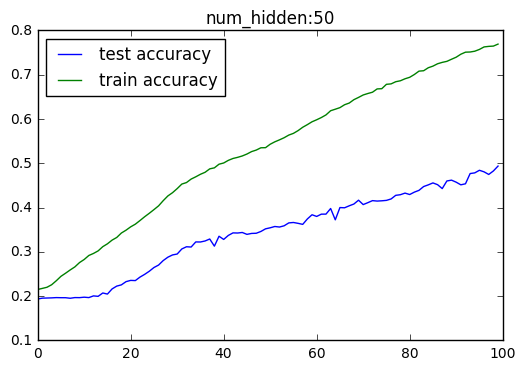

Train max accuracy:0.769
Test max accuracy:0.494


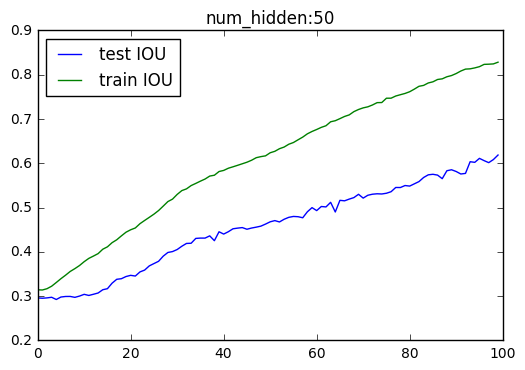

Train max IOU:0.828
Test max IOU:0.619


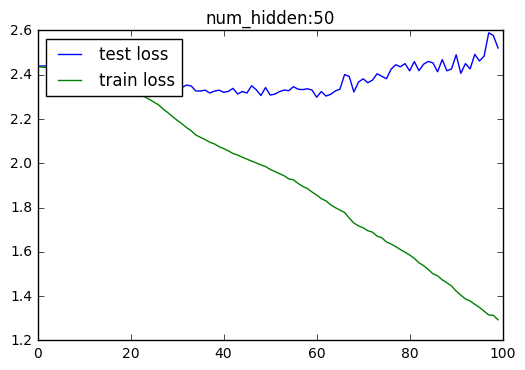

Train min loss:1.293
Test min loss:2.298
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


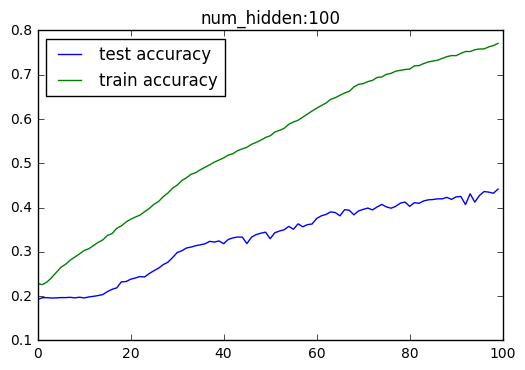

Train max accuracy:0.771
Test max accuracy:0.442


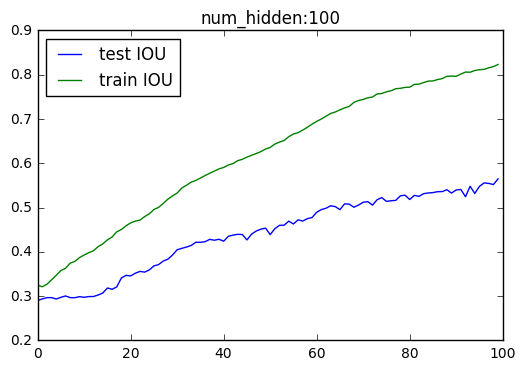

Train max IOU:0.823
Test max IOU:0.565


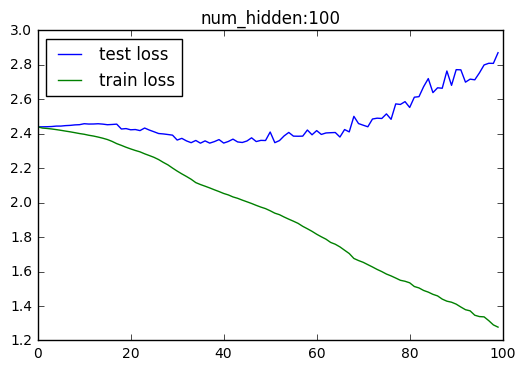

Train min loss:1.277
Test min loss:2.345
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


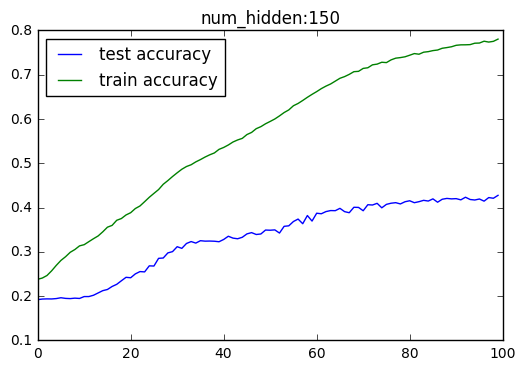

Train max accuracy:0.780
Test max accuracy:0.428


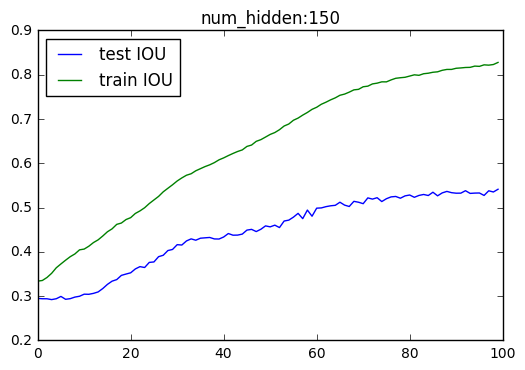

Train max IOU:0.828
Test max IOU:0.541


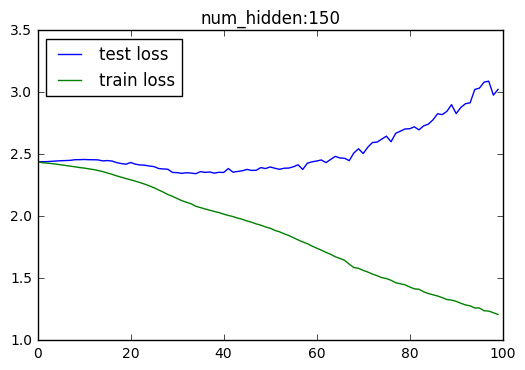

Train min loss:1.210
Test min loss:2.345
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


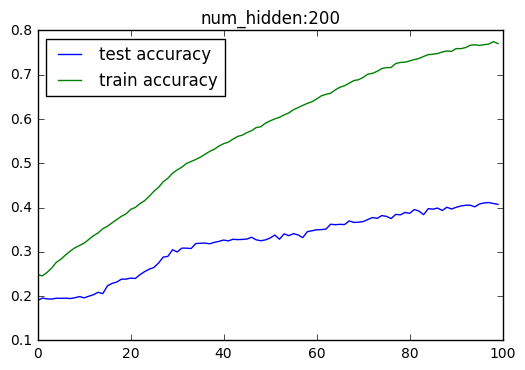

Train max accuracy:0.775
Test max accuracy:0.411


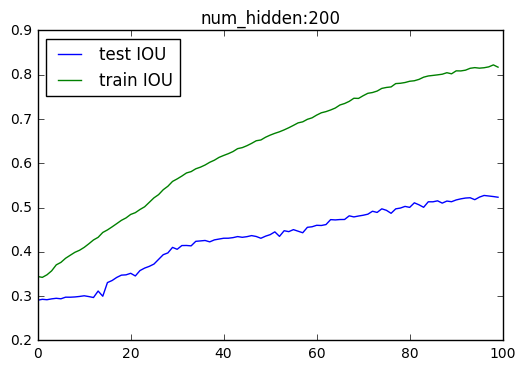

Train max IOU:0.822
Test max IOU:0.527


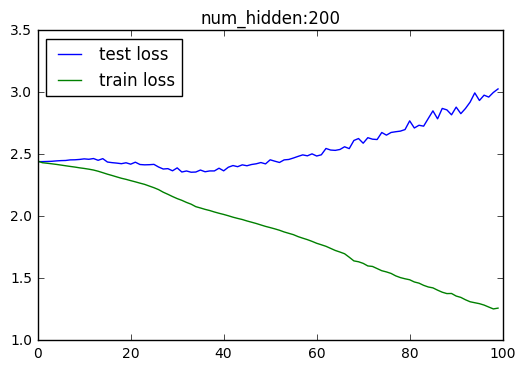

Train min loss:1.254
Test min loss:2.357
---------------------------------------------------------------------------------------------------- 



In [74]:
stats(test_res, train_res, titel='num_hidden')

# Grounder with bi-directional RNN

In [76]:
# Base with bidirectional rnn
bi_test_res, bi_train_res = [], []

for num_hidden in [50, 100, 150, 200]:
    params_dir = params_dir_tmp+'base/Bi_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        useBidirectionalRnn=True,
        bnorm=False
    )


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0)
    
    bi_test_res.append(tst)
    bi_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')
    
    
np.save(open('../data/training/results/bi_test_res.bin', 'wb'), bi_test_res)
np.save(open('../data/training/results/bi_train_res.bin', 'wb'), bi_train_res)

params_dir: ../data/training/models/All/base/Bi_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 1.845 ;acc: 0.360 ;iou: 0.485 ;time: 0:00:01
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 1.910 ;acc: 0.310 ;iou: 0.370 ;time: 0:00:06
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 3.016 ;acc: 0.095 ;iou: 0.195 ;time: 0:00:13
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 3.329 ;acc: 0.130 ;iou: 0.215 ;time: 0:00:19
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 2.889 ;acc: 0.140 ;iou: 0.265 ;time: 0:00:25
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 1.927 ;acc: 0.285 ;iou: 0.385 ;time: 0:00:31

*Training B: True ;B Train loss: 2.437 ;Train accuracy: 0.218 ;IOU accuracy: 0.314 ;Time: 0:00:36 

Testing, e

### Results stats

num_hidden: 50


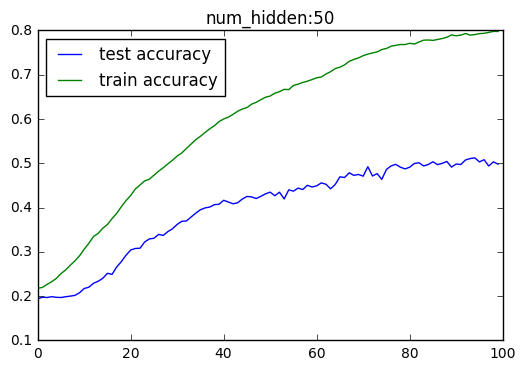

Train max accuracy:0.798
Test max accuracy:0.512


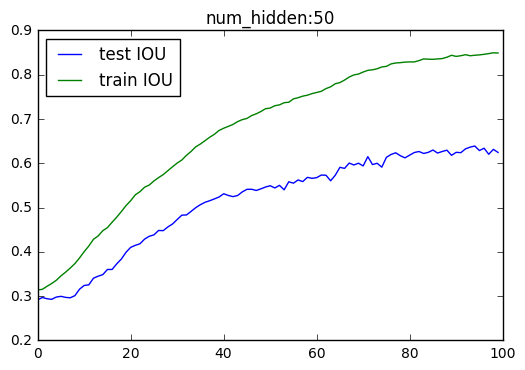

Train max IOU:0.850
Test max IOU:0.639


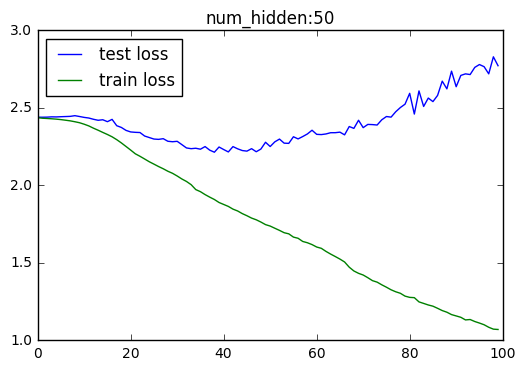

Train min loss:1.071
Test min loss:2.214
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


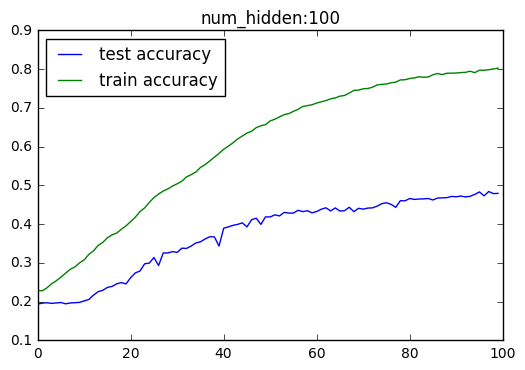

Train max accuracy:0.803
Test max accuracy:0.484


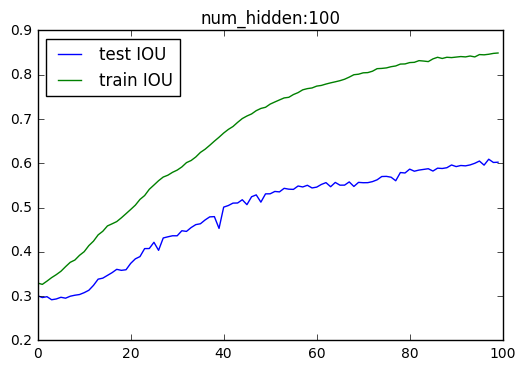

Train max IOU:0.849
Test max IOU:0.609


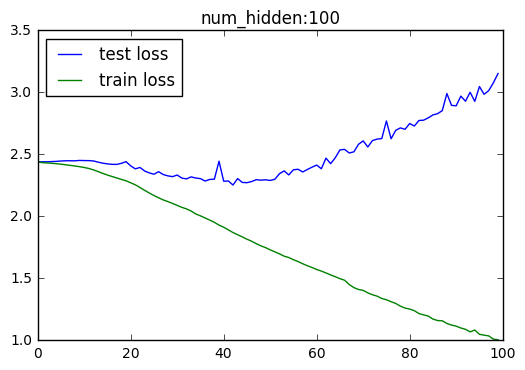

Train min loss:1.006
Test min loss:2.253
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


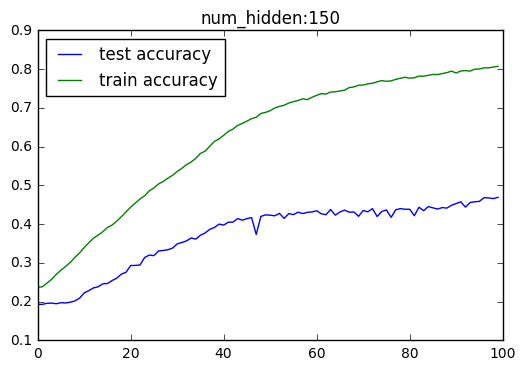

Train max accuracy:0.807
Test max accuracy:0.469


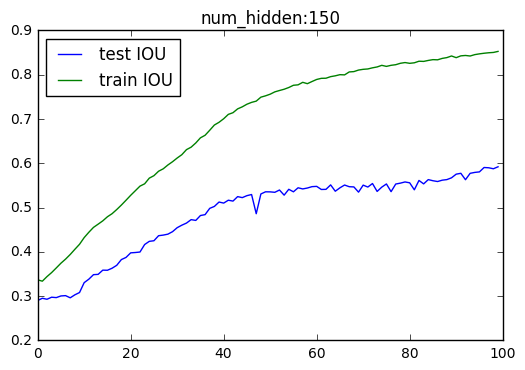

Train max IOU:0.853
Test max IOU:0.592


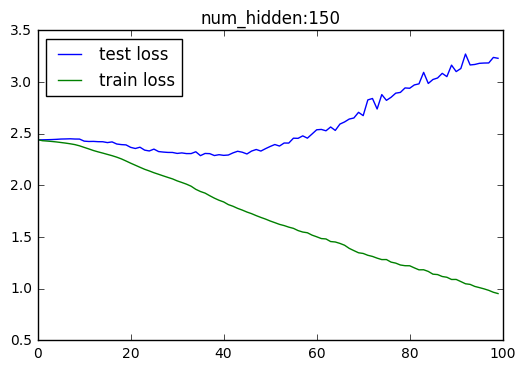

Train min loss:0.954
Test min loss:2.288
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


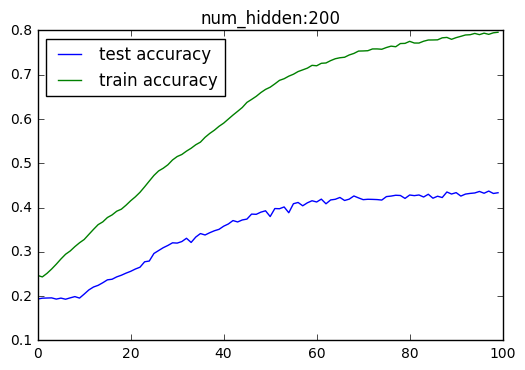

Train max accuracy:0.796
Test max accuracy:0.437


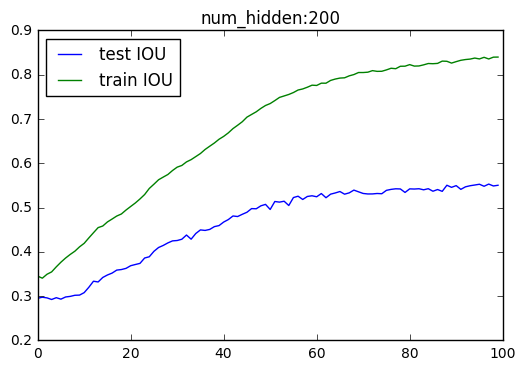

Train max IOU:0.840
Test max IOU:0.553


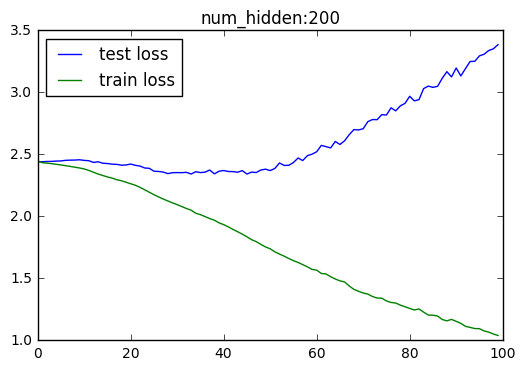

Train min loss:1.040
Test min loss:2.342
---------------------------------------------------------------------------------------------------- 



In [77]:
stats(bi_test_res, bi_train_res, titel='num_hidden')

# Grounder with bi-directional RNN and attention
<p> Here, at each time step, we use attention mechanism over all the bboxes</p>

In [99]:
# Base with bidirectional rnn and word level attention
biAttn_test_res, biAttn_train_res = [], []

for num_hidden in [50, 100, 150, 200]:
    params_dir = params_dir_tmp+'base/BiAttn_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.99, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        useBidirectionalRnn=True,
        bnorm=False,
        use_wordAttn=True
    )


    # start comphttp://localhost:8888/notebooks/testing/All.ipynb#
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0)
    
    biAttn_test_res.append(tst)
    biAttn_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

params_dir: ../data/training/models/All/base/BiAttn_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 2.199 ;acc: 0.255 ;iou: 0.340 ;time: 0:00:01
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 3.016 ;acc: 0.140 ;iou: 0.240 ;time: 0:00:14
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 3.092 ;acc: 0.105 ;iou: 0.230 ;time: 0:00:27
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 2.935 ;acc: 0.090 ;iou: 0.180 ;time: 0:00:39
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 2.598 ;acc: 0.170 ;iou: 0.270 ;time: 0:00:53
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 2.158 ;acc: 0.215 ;iou: 0.320 ;time: 0:01:07

*Training B: True ;B Train loss: 2.437 ;Train accuracy: 0.221 ;IOU accuracy: 0.323 ;Time: 0:01:19 

Testin

num_hidden: 50


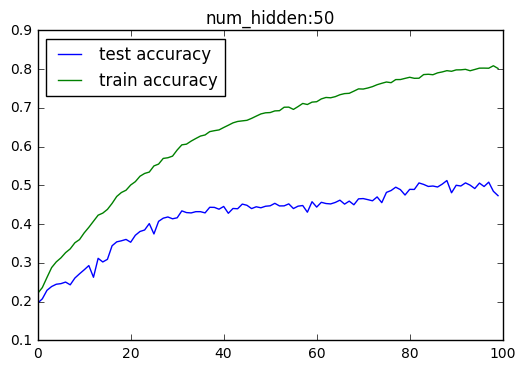

Train max accuracy:0.809
Test max accuracy:0.513


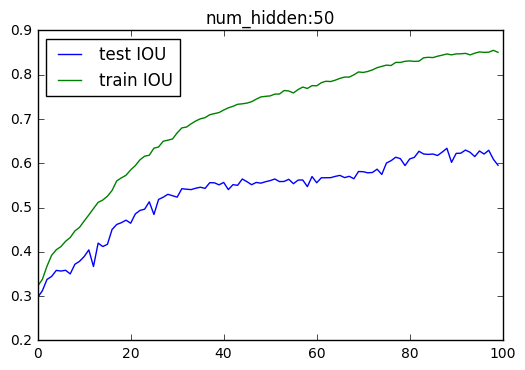

Train max IOU:0.855
Test max IOU:0.634


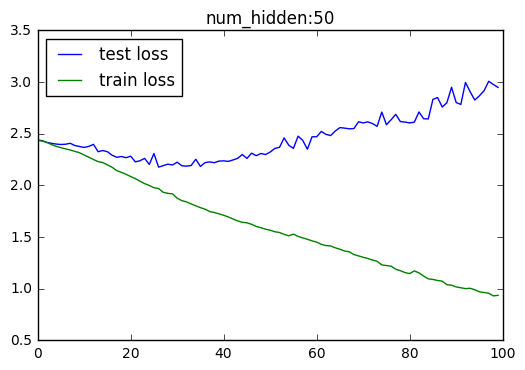

Train min loss:0.931
Test min loss:2.177
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


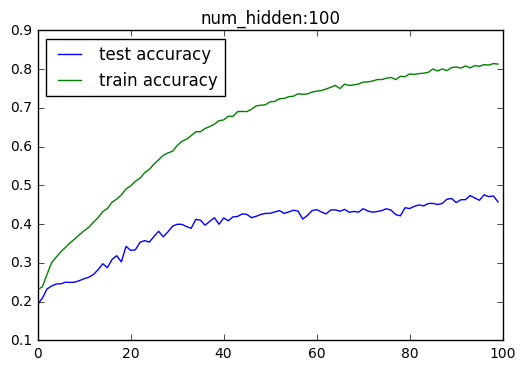

Train max accuracy:0.814
Test max accuracy:0.476


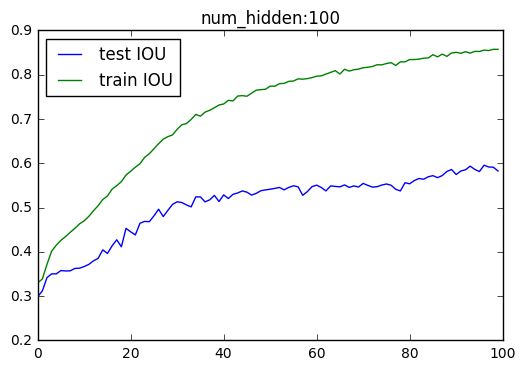

Train max IOU:0.857
Test max IOU:0.596


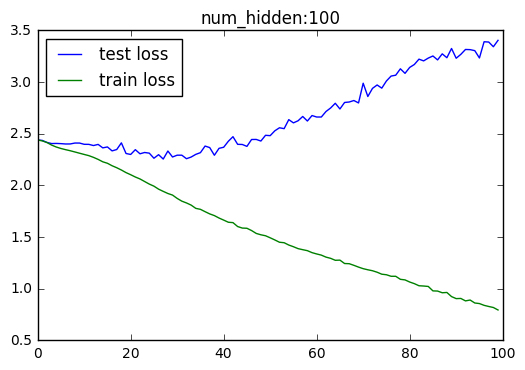

Train min loss:0.795
Test min loss:2.256
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


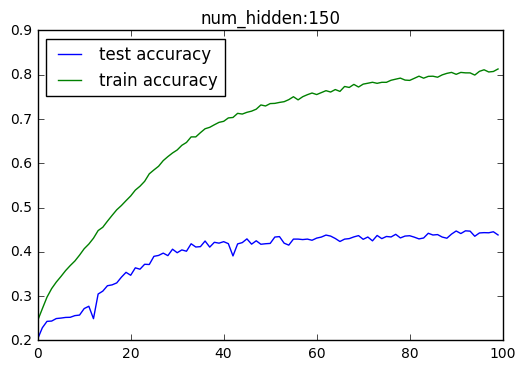

Train max accuracy:0.813
Test max accuracy:0.448


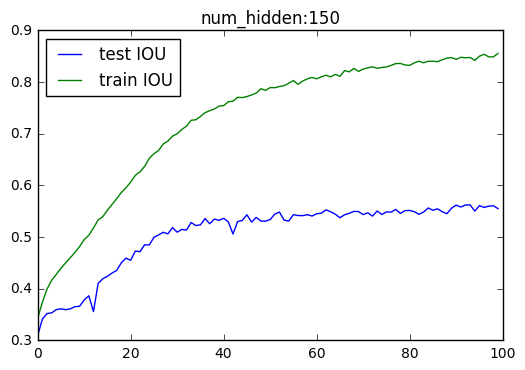

Train max IOU:0.855
Test max IOU:0.562


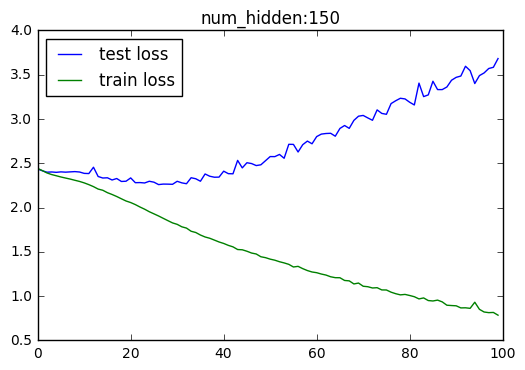

Train min loss:0.785
Test min loss:2.260
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


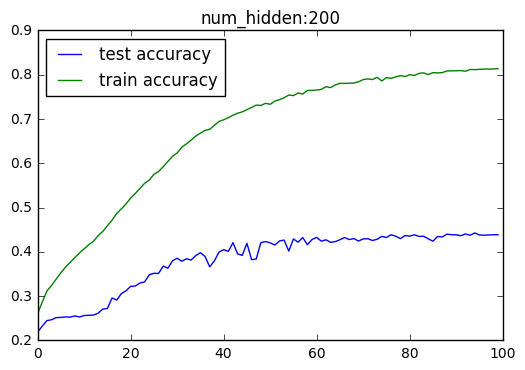

Train max accuracy:0.814
Test max accuracy:0.443


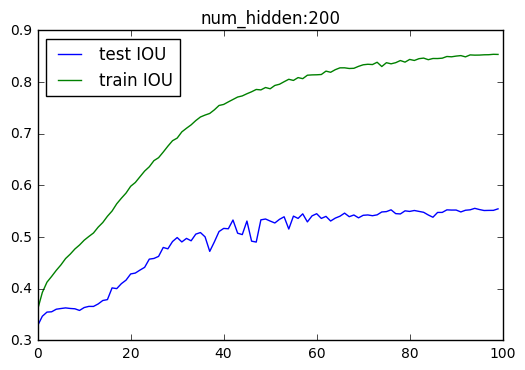

Train max IOU:0.854
Test max IOU:0.556


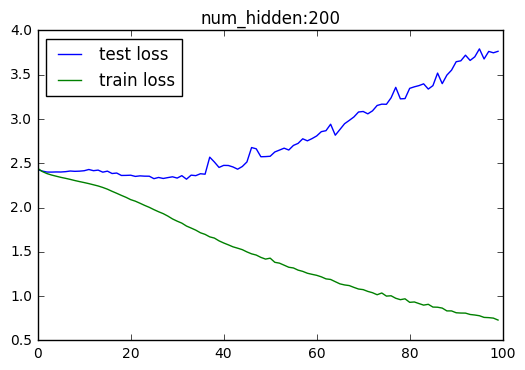

Train min loss:0.730
Test min loss:2.321
---------------------------------------------------------------------------------------------------- 



In [100]:
np.save(open('../data/training/results/biAttn_test_res.bin', 'wb'), biAttn_test_res)
np.save(open('../data/training/results/biAttn_train_res.bin', 'wb'), biAttn_train_res)
stats(biAttn_test_res, biAttn_train_res, titel='num_hidden')

# Batch Normalization
<p>Here we use one directional RNN and no words level attention.<br>
We use batch normalization to both the images and the RNN's final outputs before the final attention layer. Again, we test for the same hidden units sizes and we run for 50 ephocs.</p>

<p> Here the test set IOU is gets up to 75.2% (from 63.4%) while the train set IOU gets to 89.9% (from 85.5%).</p>

In [18]:
# Base model with batch normailzation

bnorm_test_res, bnorm_train_res = [], []

for num_hidden in [50, 100, 150, 200]:
    params_dir = params_dir_tmp+'bnorm_base/hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.99, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=True)


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=51,
            activation_ephoc=51,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0)
    
    bnorm_test_res.append(tst)
    bnorm_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

params_dir: ../data/training/models/All/bnorm_base/hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 3.592 ;acc: 0.110 ;iou: 0.190 ;time: 0:00:01
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 2.689 ;acc: 0.175 ;iou: 0.280 ;time: 0:00:10
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 2.671 ;acc: 0.170 ;iou: 0.250 ;time: 0:00:19
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 3.470 ;acc: 0.085 ;iou: 0.135 ;time: 0:00:28
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 1.999 ;acc: 0.230 ;iou: 0.320 ;time: 0:00:37
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 3.180 ;acc: 0.080 ;iou: 0.160 ;time: 0:00:47

*Training B: True ;B Train loss: 2.302 ;Train accuracy: 0.242 ;IOU accuracy: 0.337 ;Time: 0:00:54 

Testing

In [67]:
np.save(open('../data/training/results/bnorm_train_res.bin', 'wb'), bnorm_train_res)
np.save(open('../data/training/results/bnorm_test_res.bin', 'wb'), bnorm_test_res)

num_hidden: 50


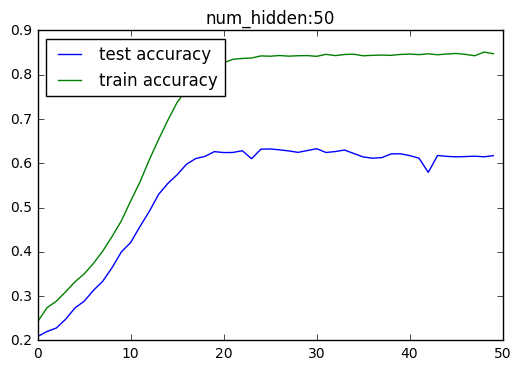

Train max accuracy:0.851
Test max accuracy:0.633


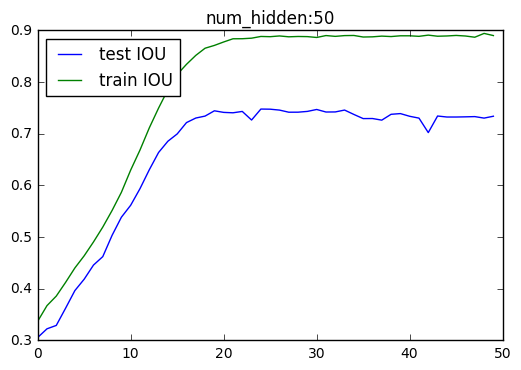

Train max IOU:0.894
Test max IOU:0.748


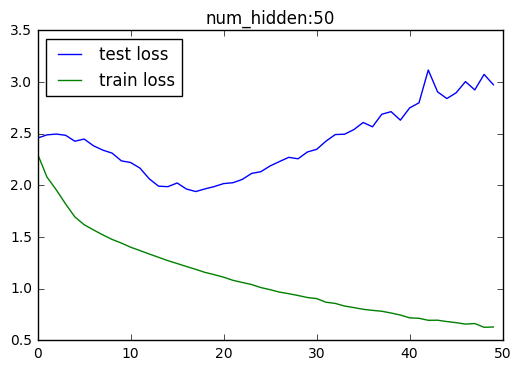

Train min loss:0.627
Test min loss:1.941
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


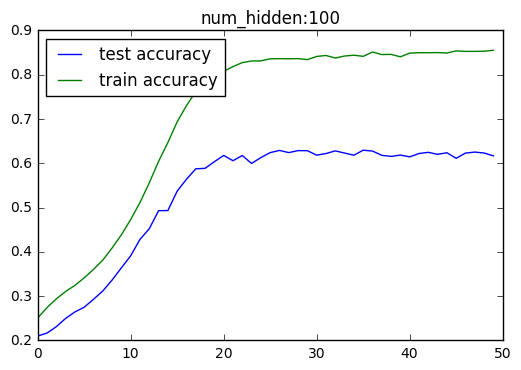

Train max accuracy:0.855
Test max accuracy:0.630


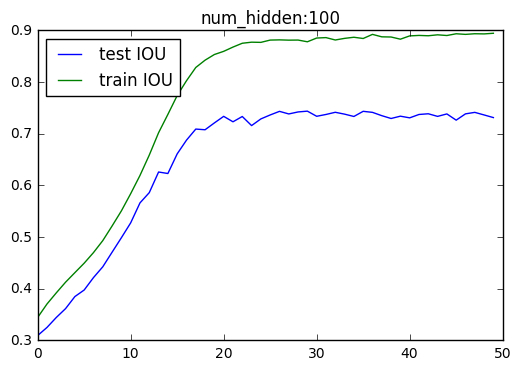

Train max IOU:0.895
Test max IOU:0.744


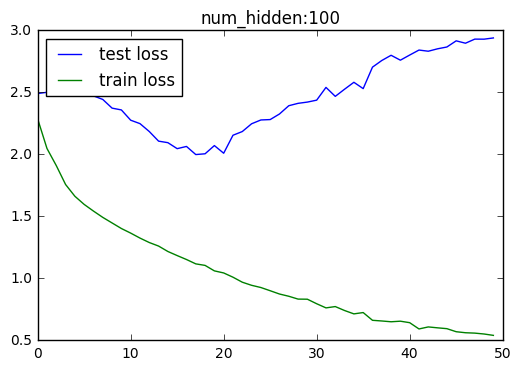

Train min loss:0.541
Test min loss:1.999
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


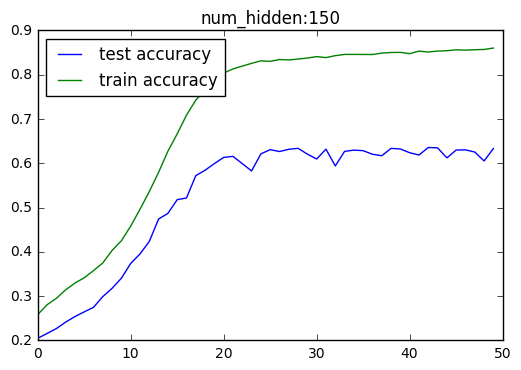

Train max accuracy:0.860
Test max accuracy:0.636


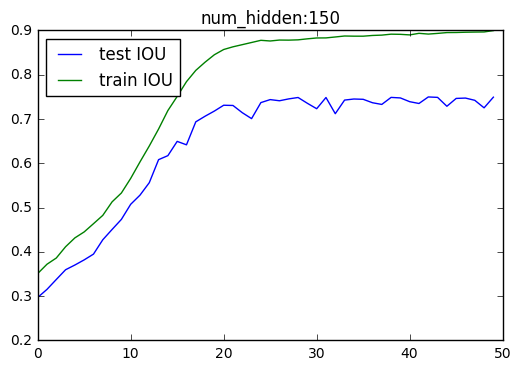

Train max IOU:0.900
Test max IOU:0.750


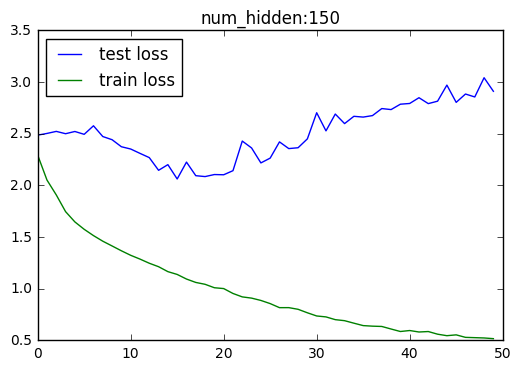

Train min loss:0.517
Test min loss:2.063
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


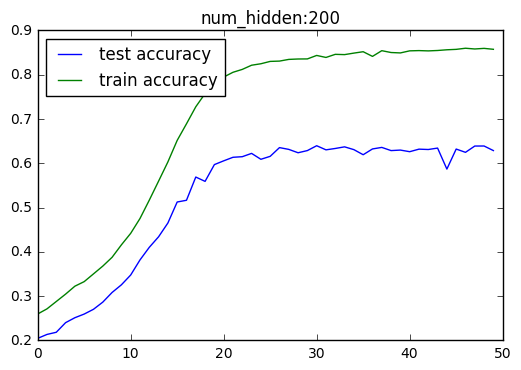

Train max accuracy:0.860
Test max accuracy:0.640


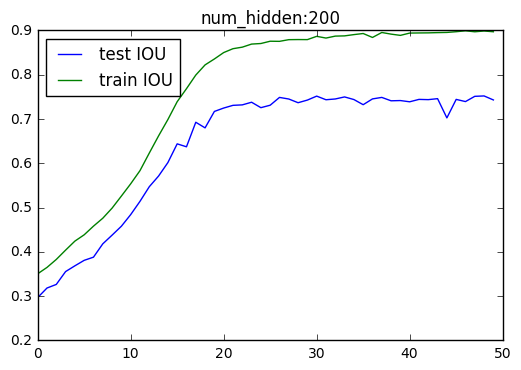

Train max IOU:0.899
Test max IOU:0.752


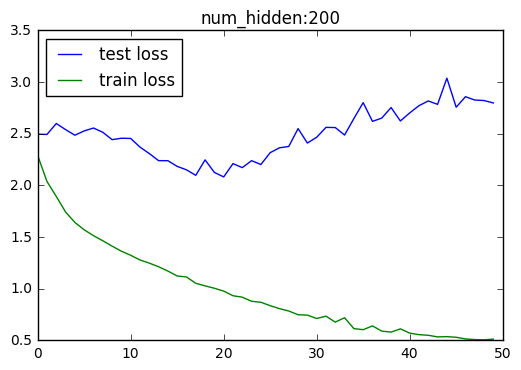

Train min loss:0.506
Test min loss:2.082
---------------------------------------------------------------------------------------------------- 



In [52]:
stats(bnorm_test_res, bnorm_train_res, ephocs=50)

# Dropout

<p> We test the model (with batch normalization) for different numbers of hidden units and dropout ratio. We test dropout for the RNN's input, outputs and both.</p>

In [13]:
#dropout_in : dropout ratio for the RNN's inputs
#dropout_out : dropout ratio for the RNN's outputs

dout_bnorm_test_res, dout_bnorm_train_res = [], []
drpos_ratio = [[0.5, 1.], [1., 0.5], [.5,.5]]
for num_hidden in [50, 100, 150, 200]:
    for drops in drpos_ratio:
        dropout_in, dropout_out = drops
        params_dir = params_dir_tmp+'bnorm_base/drop_'+str(dropout_in)+','+str(dropout_out)+'_hidden:'+str(num_hidden)
        tf.reset_default_graph()
        m = Model(
            batch_size=200, 
            num_hidden=num_hidden,
            embed_size=embed_vecs.shape[1],
            img_dims=trainset[0][0][1][0].shape[1], 
            bbox_dims=trainset[0][0][1][1].shape[1], 
            lr=.05,
            vocab=vocab, 
            decay_steps=10000, 
            decay_rate=0.99, 
            edit_reward=0.,
            rnn_editProb=0.,
            coefAlr=1,
            bnorm=True)


        # start comp
        print('dropout_in', dropout_in)
        print('dropout_out', dropout_out)
        print('params_dir:', params_dir)
        print('num_hidden:', m.num_hidden)
        print('learning rate:', m.lr)
        tst, trn = m.train(trainset, testset,
                ephocs_num=50,
                start_ephoc=0,
                startA=51,
                activation_ephoc=51,
                muteB=0, 
                activateAProb=0,
                max_activateAProb=0,
                editProb=0,
                edit_reward=0,
                dropout_in=dropout_in,
                dropout_out=dropout_out)

        dout_bnorm_test_res.append(tst)
        dout_bnorm_train_res.append(trn)
        print('\n'+'*'*100)
        print('*'*100)
        print('*'*100,'\n')

dropout_in 0.5
dropout_out 1.0
params_dir: ../data/training/models/All/bnorm_base/drop_0.5,1.0_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 1.422 ;acc: 0.465 ;iou: 0.655 ;time: 0:00:00
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 2.787 ;acc: 0.140 ;iou: 0.270 ;time: 0:00:08
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 3.065 ;acc: 0.115 ;iou: 0.205 ;time: 0:00:16
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 2.988 ;acc: 0.130 ;iou: 0.225 ;time: 0:00:24
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 3.231 ;acc: 0.115 ;iou: 0.200 ;time: 0:00:34
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 1.762 ;acc: 0.345 ;iou: 0.445 ;time: 0:00:43

*Training B: True ;B Train loss: 2.383 ;Train accuracy: 0.238 ;

In [14]:
np.save(open('../data/training/results/dout_bnorm_train_res.bin', 'wb'), dout_bnorm_train_res)
np.save(open('../data/training/results/dout_bnorm_test_res.bin', 'wb'), dout_bnorm_test_res)

num_hidden: 50


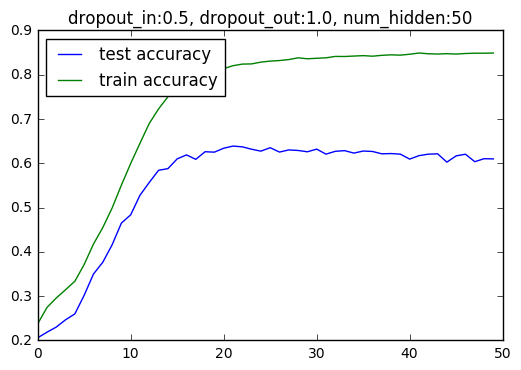

Train max accuracy:0.849
Test max accuracy:0.639


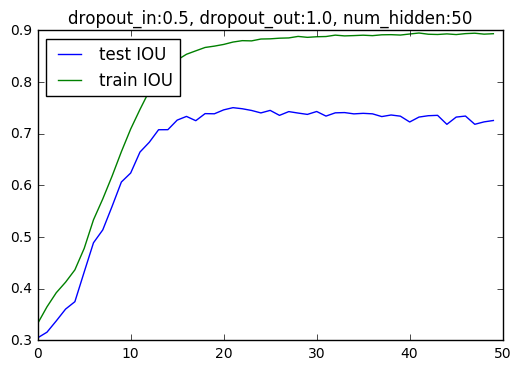

Train max IOU:0.895
Test max IOU:0.751


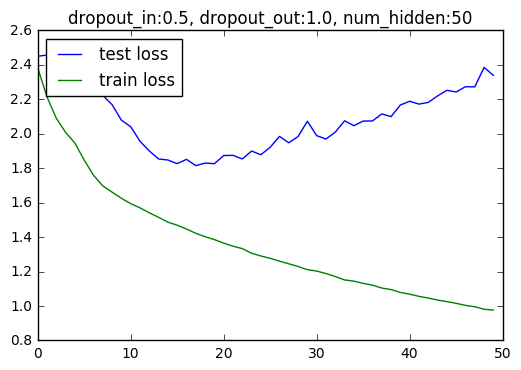

Train min loss:0.976
Test min loss:1.815
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


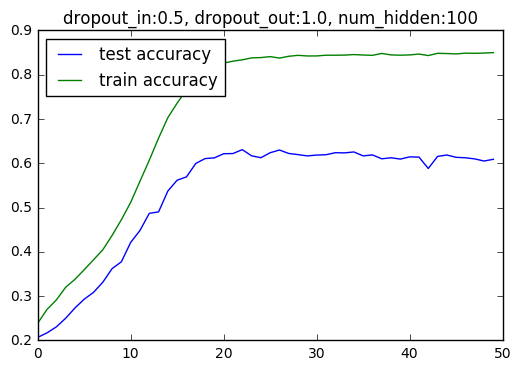

Train max accuracy:0.850
Test max accuracy:0.631


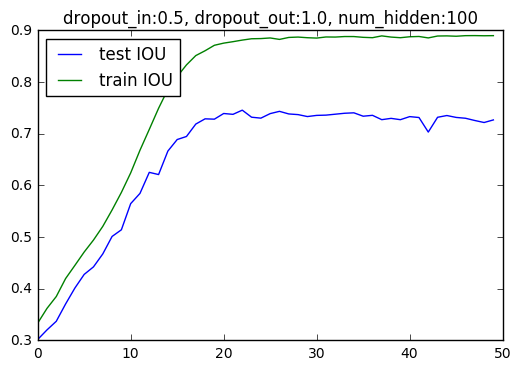

Train max IOU:0.890
Test max IOU:0.746


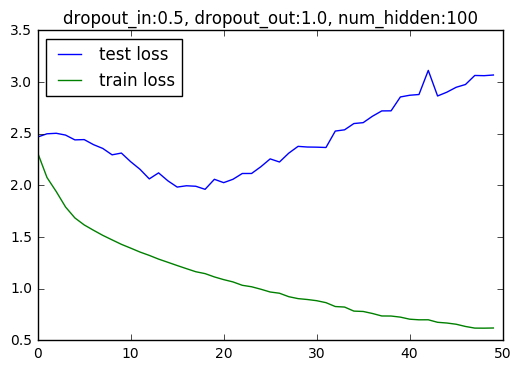

Train min loss:0.619
Test min loss:1.962
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


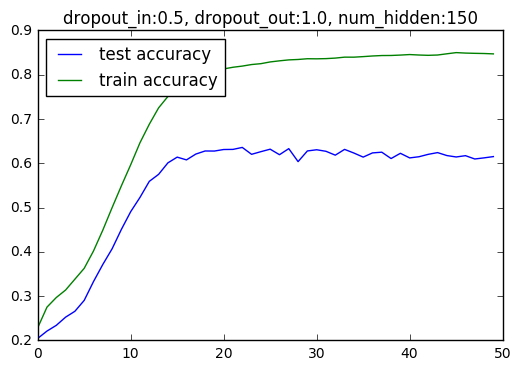

Train max accuracy:0.850
Test max accuracy:0.636


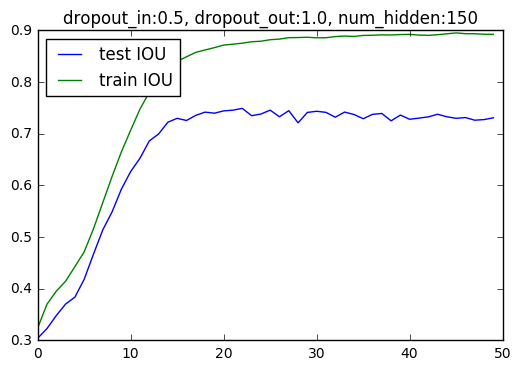

Train max IOU:0.895
Test max IOU:0.749


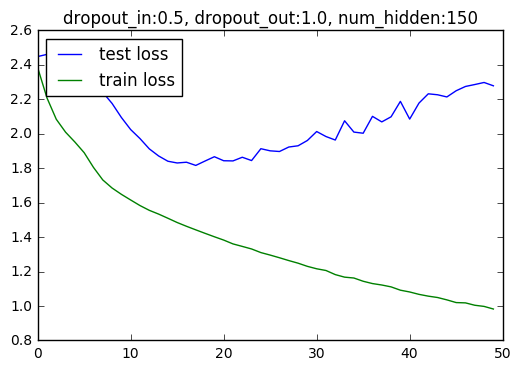

Train min loss:0.982
Test min loss:1.816
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


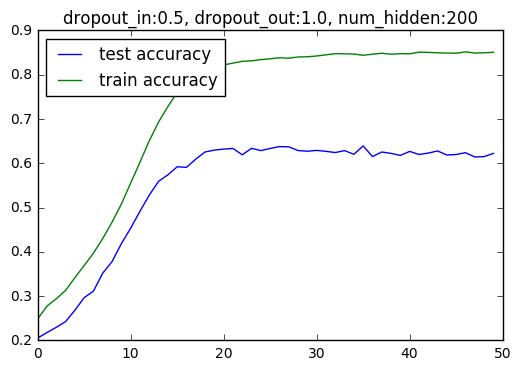

Train max accuracy:0.852
Test max accuracy:0.639


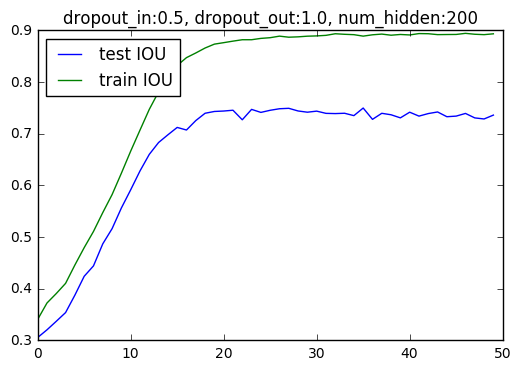

Train max IOU:0.894
Test max IOU:0.750


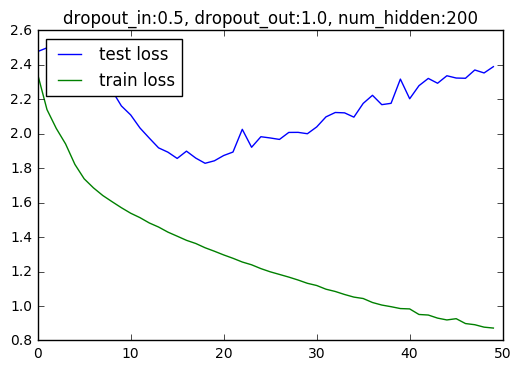

Train min loss:0.872
Test min loss:1.829
---------------------------------------------------------------------------------------------------- 

num_hidden: 50


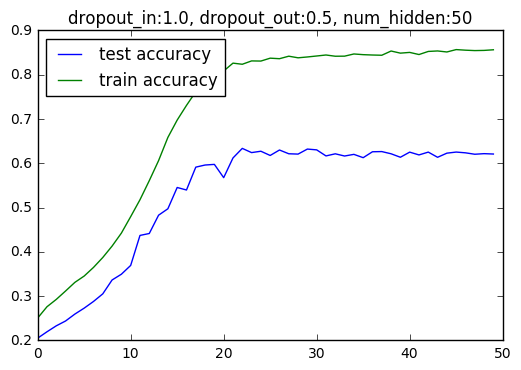

Train max accuracy:0.857
Test max accuracy:0.634


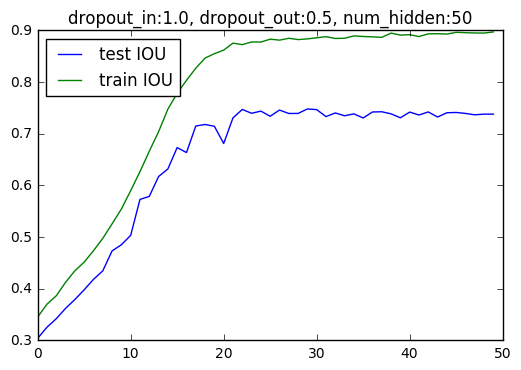

Train max IOU:0.897
Test max IOU:0.748


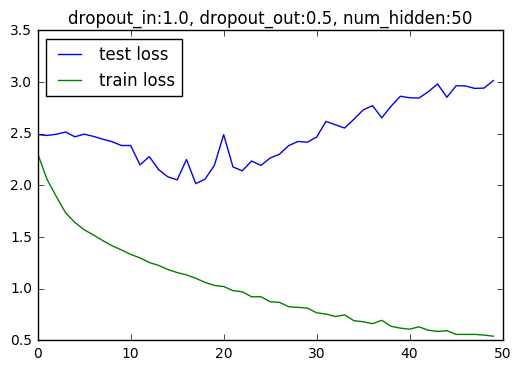

Train min loss:0.541
Test min loss:2.018
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


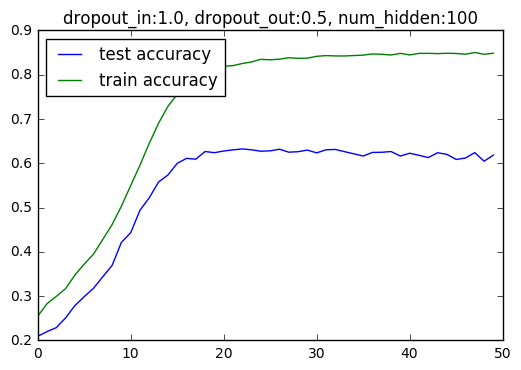

Train max accuracy:0.850
Test max accuracy:0.633


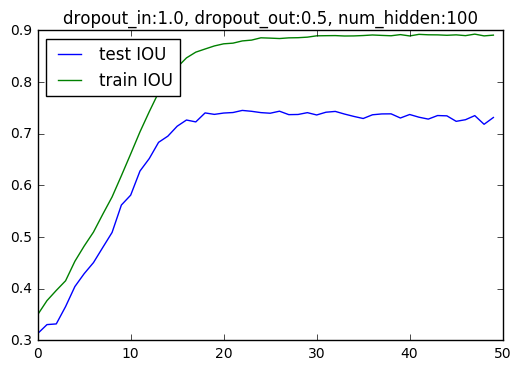

Train max IOU:0.893
Test max IOU:0.745


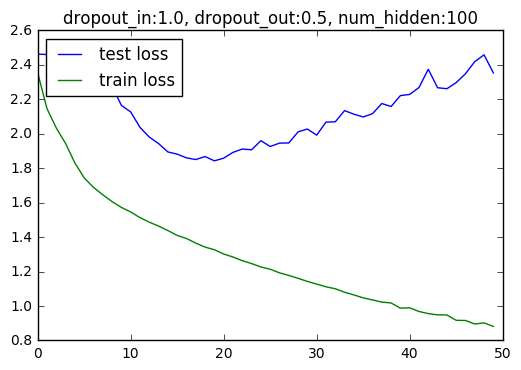

Train min loss:0.881
Test min loss:1.843
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


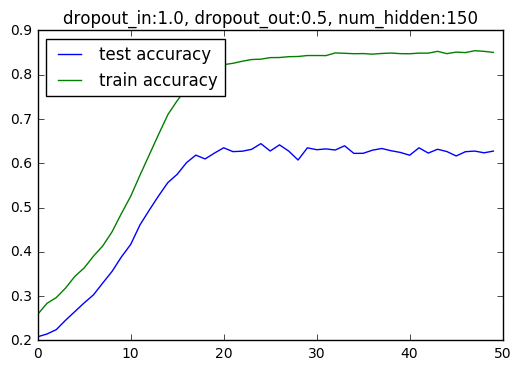

Train max accuracy:0.854
Test max accuracy:0.644


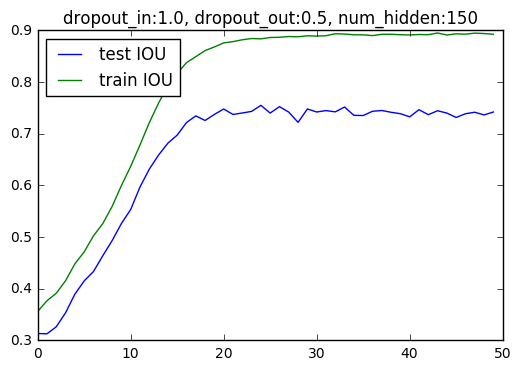

Train max IOU:0.895
Test max IOU:0.755


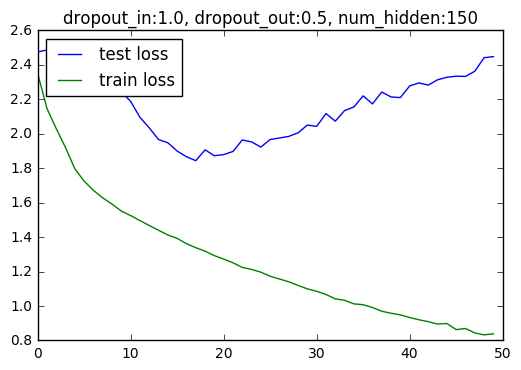

Train min loss:0.832
Test min loss:1.844
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


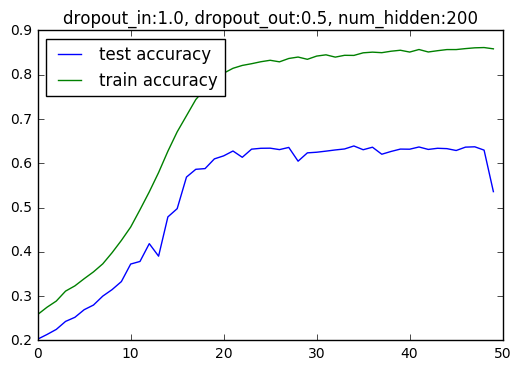

Train max accuracy:0.861
Test max accuracy:0.639


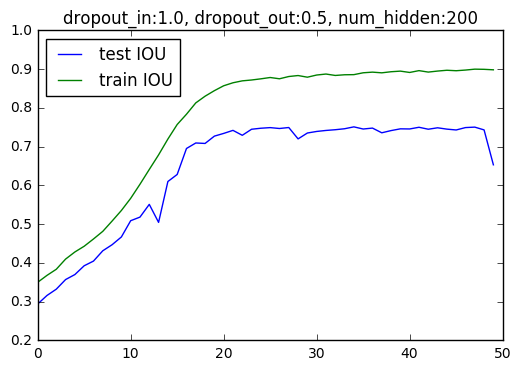

Train max IOU:0.900
Test max IOU:0.751


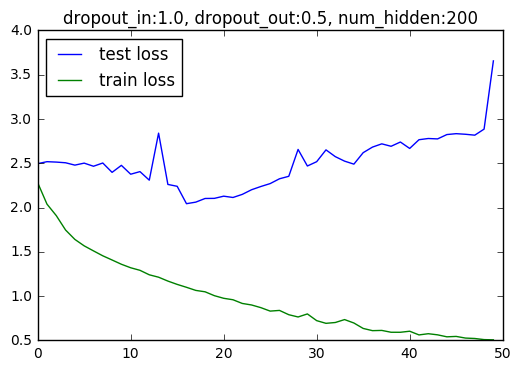

Train min loss:0.507
Test min loss:2.044
---------------------------------------------------------------------------------------------------- 

num_hidden: 50


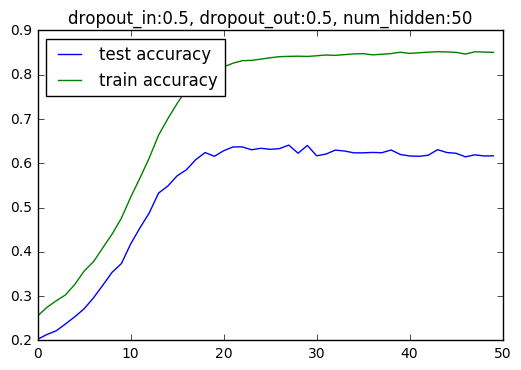

Train max accuracy:0.852
Test max accuracy:0.641


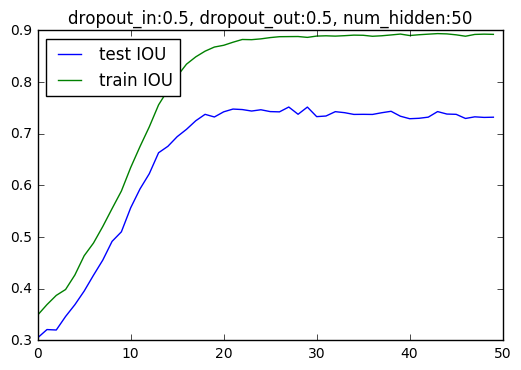

Train max IOU:0.894
Test max IOU:0.752


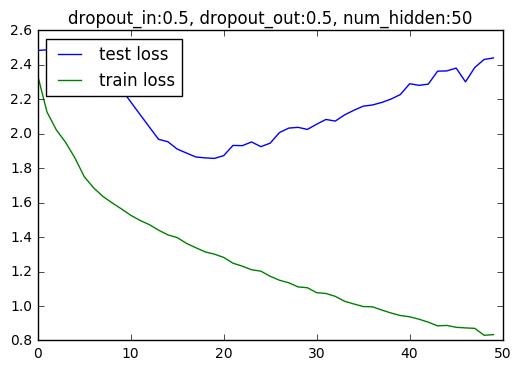

Train min loss:0.830
Test min loss:1.857
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


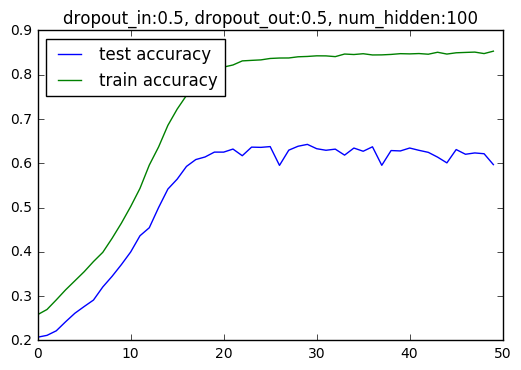

Train max accuracy:0.853
Test max accuracy:0.643


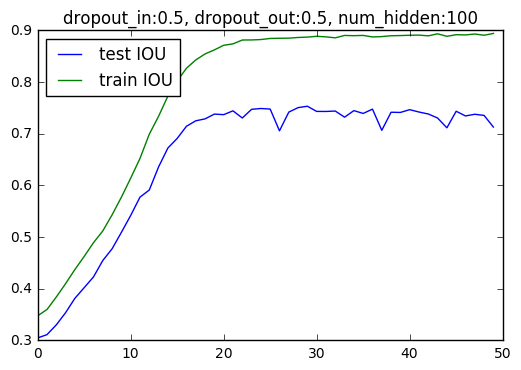

Train max IOU:0.894
Test max IOU:0.753


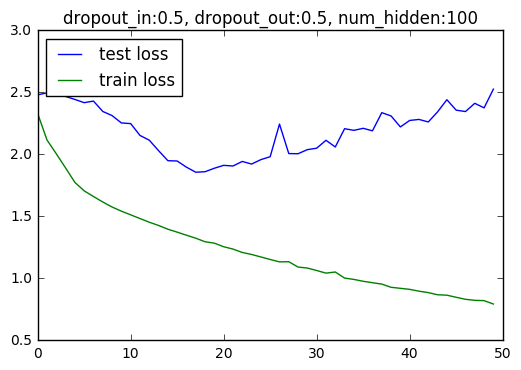

Train min loss:0.794
Test min loss:1.857
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


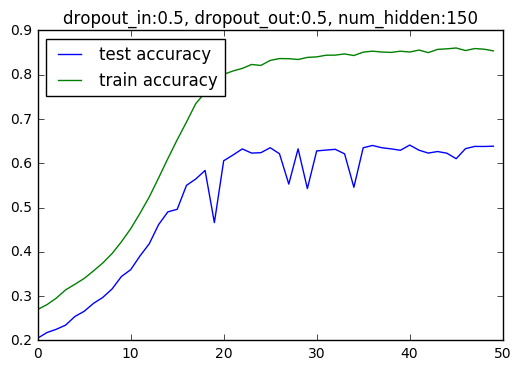

Train max accuracy:0.860
Test max accuracy:0.641


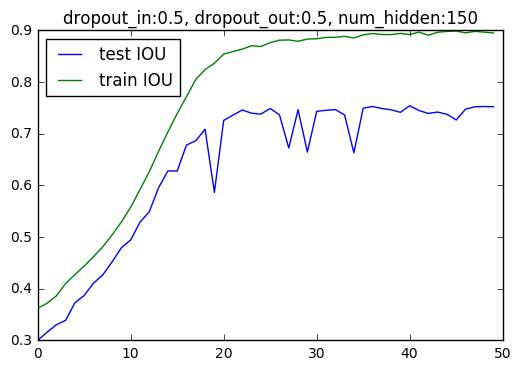

Train max IOU:0.899
Test max IOU:0.754


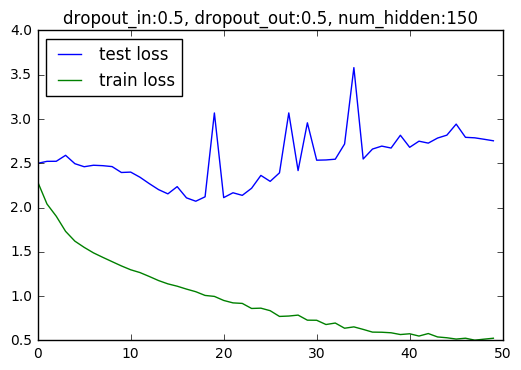

Train min loss:0.503
Test min loss:2.072
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


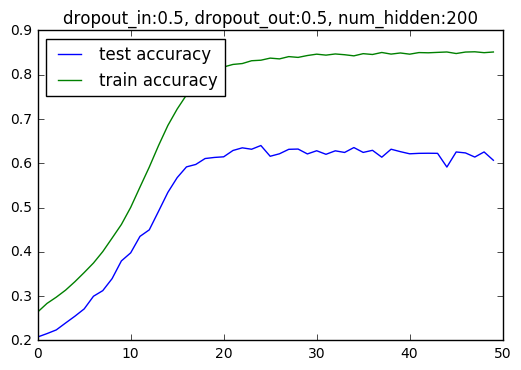

Train max accuracy:0.852
Test max accuracy:0.640


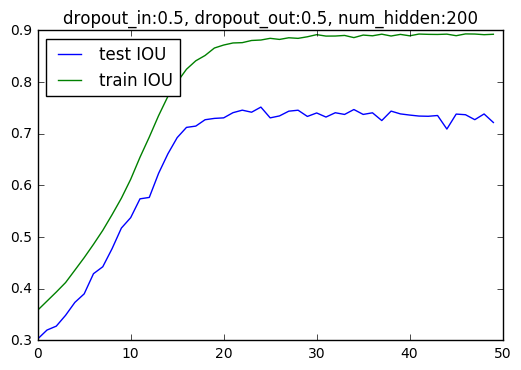

Train max IOU:0.893
Test max IOU:0.752


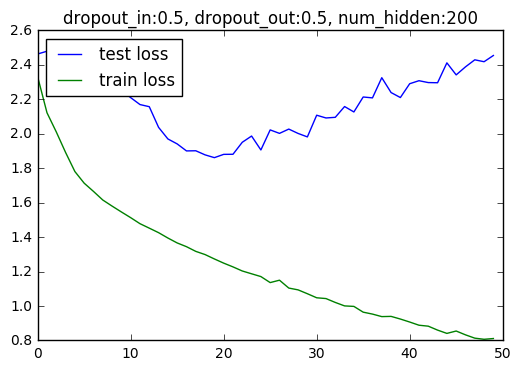

Train min loss:0.807
Test min loss:1.861
---------------------------------------------------------------------------------------------------- 



In [78]:
drpos_ratio = [[0.5, 1.], [1., 0.5], [.5,.5]]
IOUmax = [] # Max test IOU 
for i, rat in enumerate(drpos_ratio):
    stats(dout_bnorm_test_res[4*i:4*(i+1)], dout_bnorm_train_res[4*i:4*(i+1)], 
          ephocs=50, title='dropout_in:%.1f, dropout_out:%.1f'%(rat[0], rat[1]))
    IOUmax.append([max(np.array(item)[:,1]) for item in dout_bnorm_test_res[4*i:4*(i+1)]])

In [123]:
print('ephoc/dropout'+' '*(20-len('ephoc/dropout')), end='')
for rat in drpos_ratio:
    print(rat, end=' '*10)
print('\n')

ephocs = [50, 100, 150, 200]
for i in range(len(IOUmax[0])):
    print(ephocs[i], end=' '*(20-len(str(ephocs[i]))))
    for item in IOUmax:
        print('%.3f'%(item[i]), end=' '*15)
    print()

ephoc/dropout       [0.5, 1.0]          [1.0, 0.5]          [0.5, 0.5]          

50                  0.751               0.748               0.752               
100                 0.746               0.745               0.753               
150                 0.749               0.755               0.754               
200                 0.750               0.751               0.752               


### Image/queries Dropout

<p>Next we use 200 hidden units and we add dropout ratio of 0.5 to the images/query vectors before the final attention layer<br></p>
<ul>
<li>Using drop out only on the images vectors got us from 0.755 to 0.789</li>
<li>Using drop out only on the query vectors got us from 0.755 to 0.67</li>
<li>Using drop out on both the query and the images vectors got us from 0.755 to 0.67</li>
</ul>

In [161]:
# dropout_in +  dropout_out + drop_img
dimgq_bnorm_test_res, dimgq_bnorm_train_res = [], []
num_hidden=150
drpos_ratio = [[0.5, 1.], [1., 0.5], [.5,.5]]
for drops in drpos_ratio:
    dropout_im, dropout_q = drops
    print('dropout_im:', dropout_im)
    print('dropout_q:', dropout_q)
    params_dir = params_dir_tmp+'bnorm_base/img_drop_'+str(dropout_im)+','+str(dropout_q)+'_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.99, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=True)


    # start comp
    print('dropout_in', dropout_in)
    print('dropout_out', dropout_out)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=71,
            activation_ephoc=71,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0,
            dropout_img=dropout_im,
            dropout_q=dropout_q,
            dropout_in=1.,
            dropout_out=.5)

    dimgq_bnorm_test_res.append(tst)
    dimgq_bnorm_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')                                                             

dropout_im: 0.5
dropout_q: 1.0
dropout_in 1.0
dropout_out 0.5
params_dir: ../data/training/models/All/bnorm_base/img_drop_0.5,1.0_hidden:150
num_hidden: 150
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 4.000 ;acc: 0.105 ;iou: 0.210 ;time: 0:00:01
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 1.403 ;acc: 0.525 ;iou: 0.670 ;time: 0:00:09
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 2.657 ;acc: 0.165 ;iou: 0.270 ;time: 0:00:19
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 2.617 ;acc: 0.175 ;iou: 0.235 ;time: 0:00:28
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 2.135 ;acc: 0.280 ;iou: 0.365 ;time: 0:00:38
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 1.783 ;acc: 0.310 ;iou: 0.375 ;time: 0:00:46

*Training B: True ;B Train

In [162]:
np.save(open('../data/training/results/dimgq_bnorm_train_res.bin', 'wb'), dimgq_bnorm_train_res)
np.save(open('../data/training/results/dimgq_bnorm_test_res.bin', 'wb'), dimgq_bnorm_test_res)

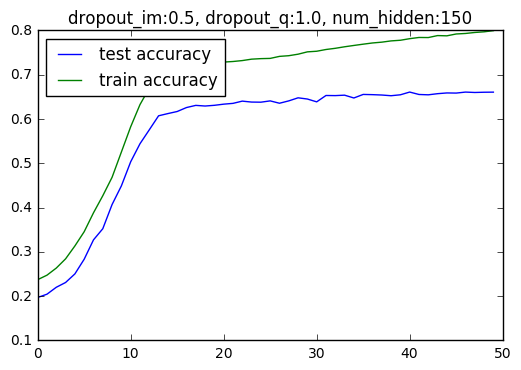

Train max accuracy:0.800
Test max accuracy:0.661


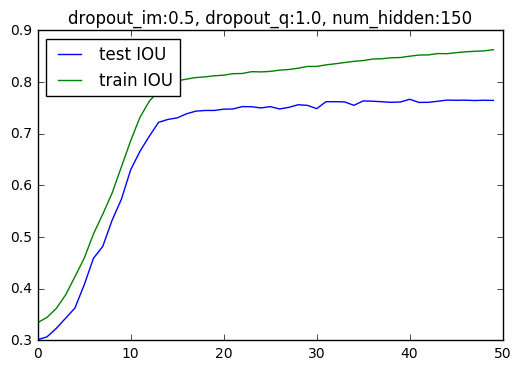

Train max IOU:0.863
Test max IOU:0.767


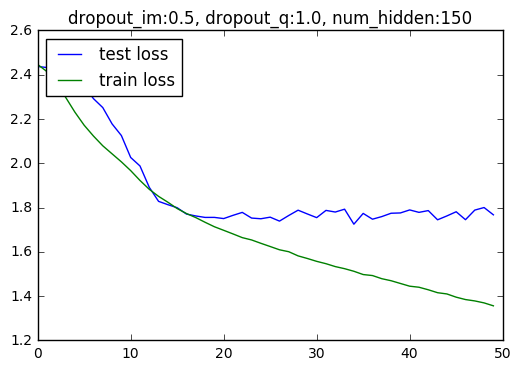

Train min loss:1.356
Test min loss:1.725
---------------------------------------------------------------------------------------------------- 



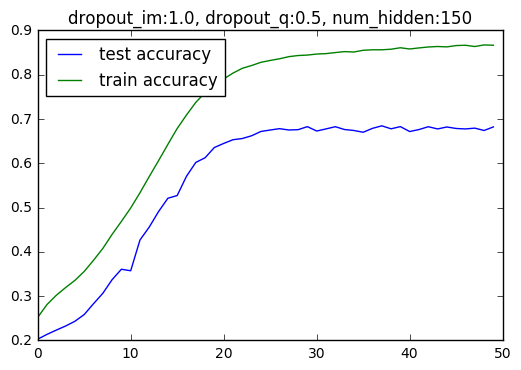

Train max accuracy:0.867
Test max accuracy:0.685


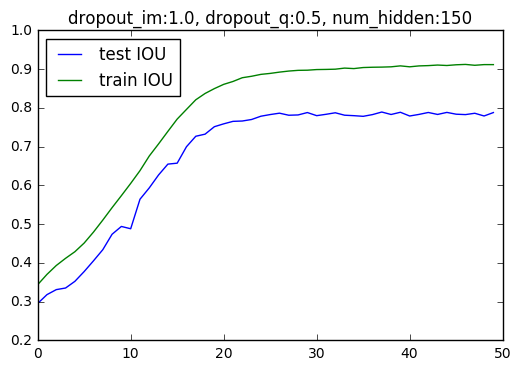

Train max IOU:0.912
Test max IOU:0.789


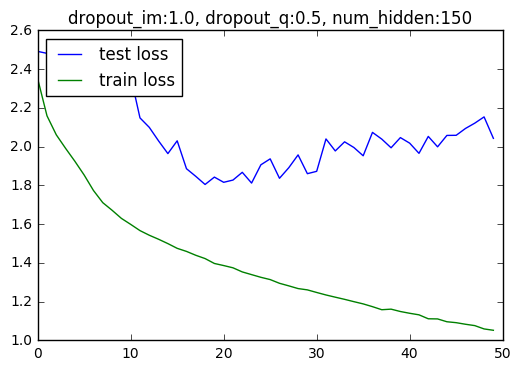

Train min loss:1.052
Test min loss:1.805
---------------------------------------------------------------------------------------------------- 



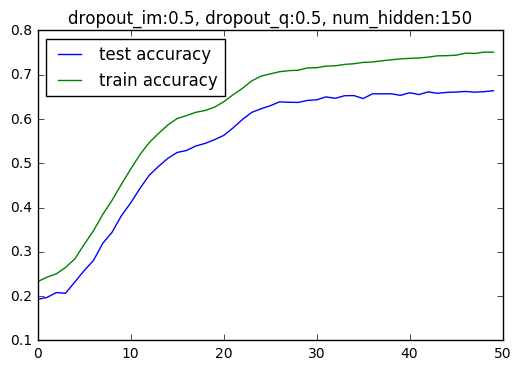

Train max accuracy:0.751
Test max accuracy:0.664


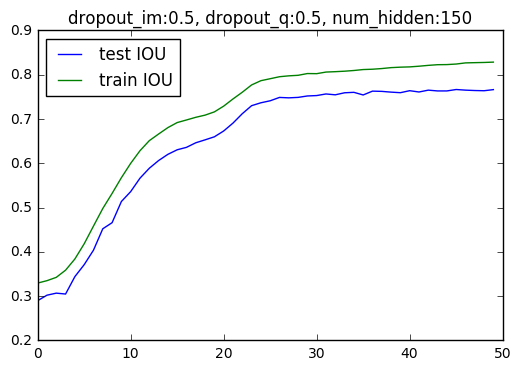

Train max IOU:0.828
Test max IOU:0.767


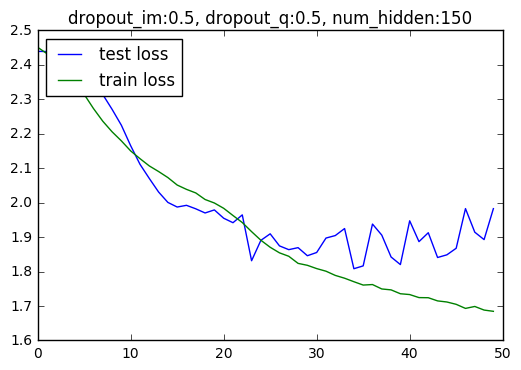

Train min loss:1.685
Test min loss:1.808
---------------------------------------------------------------------------------------------------- 



In [71]:
ephocs = range(50)
dimg_bnorm_test_res = np.array(dimgq_bnorm_test_res)
dimg_bnorm_train_res = np.array(dimgq_bnorm_train_res)

test_Glabels = ['test accuracy', 'test IOU', 'test loss']
train_Glabels = ['train accuracy', 'train IOU', 'train loss']

IOUmax = []

for j, drop_rat in enumerate([[0.5, 1.], [1., 0.5], [.5,.5]]):
    for i in range(len(train_Glabels)):
        plt.plot(ephocs, dimg_bnorm_test_res[j][:,i])
        plt.plot(ephocs, dimg_bnorm_train_res[j][:,i])
        plt.legend([test_Glabels[i], train_Glabels[i]], loc='upper left')
        plt.title('dropout_im:%.1f, dropout_q:%.1f, num_hidden:%d'%(drop_rat[0], drop_rat[1], 150))
        plt.show()

        metric = ''.join(train_Glabels[i][len('train')+1:])
        if metric=='loss':
            print('Train min %s:%.3f'%(metric, min(dimg_bnorm_train_res[j][:,i])))
            print('Test min %s:%.3f'%(metric, min(dimg_bnorm_test_res[j][:,i])))
        else:
            print('Train max %s:%.3f'%(metric, max(dimg_bnorm_train_res[j][:,i])))
            print('Test max %s:%.3f'%(metric, max(dimg_bnorm_test_res[j][:,i])))
    print('-'*100,'\n')

In [73]:
(81.8-63.5)/63.5

0.2881889763779527

# Image Scaling
<p> Scaling the VGG16's ouputs to have zero mean and 1/imScale STD (no batch normalization nor dropouts). Note that unlike batch normalization we scale the test set and train set in the same way.</p>
<p>We can see that we get up to 80.8% accuracy with 1/40 STD while running for 50 ephocs and 81.8% while running for 100 ephocs with 1/50 STD.<br>
This results outperform batch normalisation (75.5%), batch normalisation with dropouts (78.9%) and yield 28.8% gain in accuracy compare to the model with no regularization methods (63.5%).</p>
<p> This indicates that rather than using batch normalisation, we may be better off if the scaling won't depend on the trainset, since the testset may have different statistics.<br>
Moreover, it shows that a main advantage in using scaling method comes from lowering the vectors picks and making it less sparse, by doing so it is more difficult for the model to overfit.</p>
<p> The improvement is especially visible in the graphs, here they seems much more stable and less overfitted

#### STD = 0.5

In [13]:
imSc_test_res, imSc_train_res = [], []

for num_hidden in [50, 100, 150, 200]:
    params_dir = params_dir_tmp+'base/imSc_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=False
    )


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0,
            imScale=2)
    
    imSc_test_res.append(tst)
    imSc_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

params_dir: ../data/training/models/All/base/imSc_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 3.293 ;acc: 0.080 ;iou: 0.160 ;time: 0:00:00
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 2.601 ;acc: 0.125 ;iou: 0.225 ;time: 0:00:07
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 3.323 ;acc: 0.080 ;iou: 0.165 ;time: 0:00:14
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 1.864 ;acc: 0.255 ;iou: 0.360 ;time: 0:00:21
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 2.699 ;acc: 0.150 ;iou: 0.210 ;time: 0:00:28
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 1.540 ;acc: 0.385 ;iou: 0.505 ;time: 0:00:35

*Training B: True ;B Train loss: 2.431 ;Train accuracy: 0.202 ;IOU accuracy: 0.295 ;Time: 0:00:42 

Testing,

In [15]:
np.save(open('../data/training/results/imSc_train_res.bin', 'wb'), imSc_train_res)
np.save(open('../data/training/results/imSc_test_res.bin', 'wb'), imSc_test_res)

num_hidden: 50


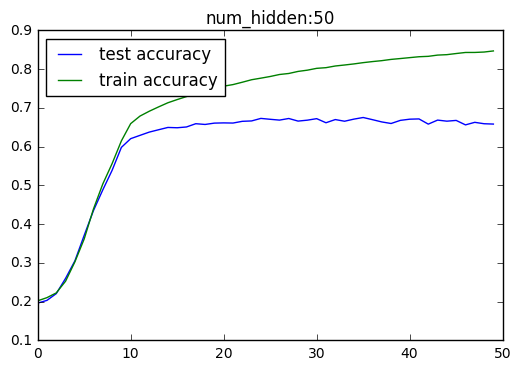

Train max accuracy:0.847
Test max accuracy:0.675


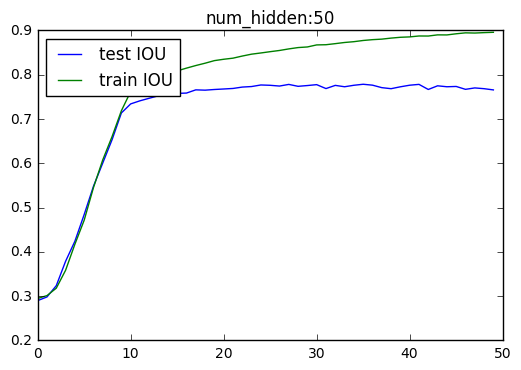

Train max IOU:0.896
Test max IOU:0.778


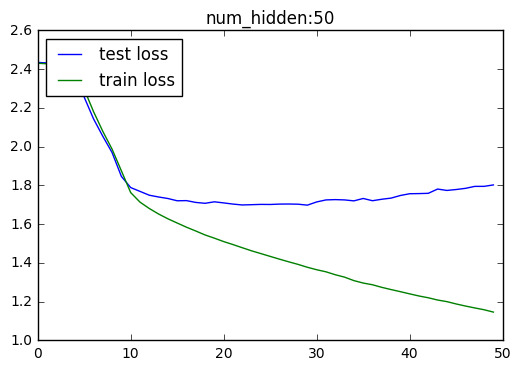

Train min loss:1.146
Test min loss:1.698
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


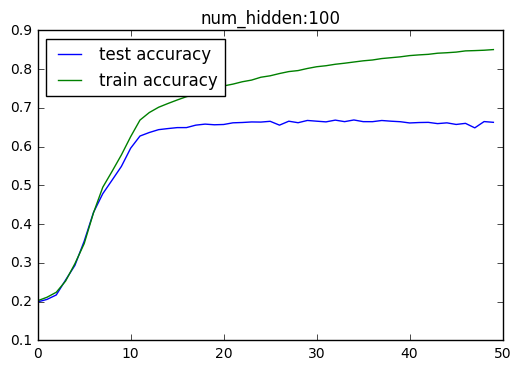

Train max accuracy:0.851
Test max accuracy:0.669


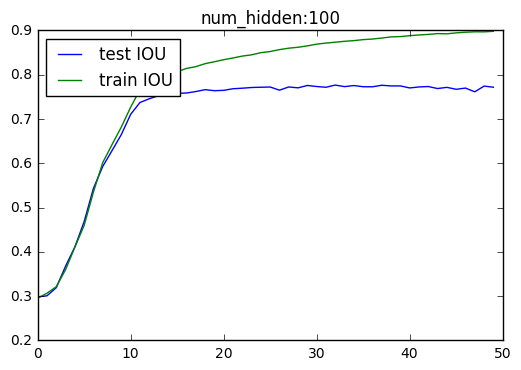

Train max IOU:0.898
Test max IOU:0.777


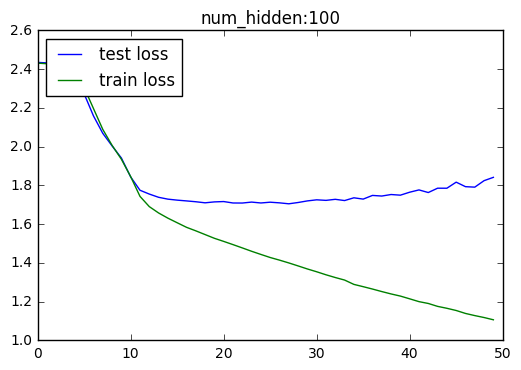

Train min loss:1.107
Test min loss:1.705
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


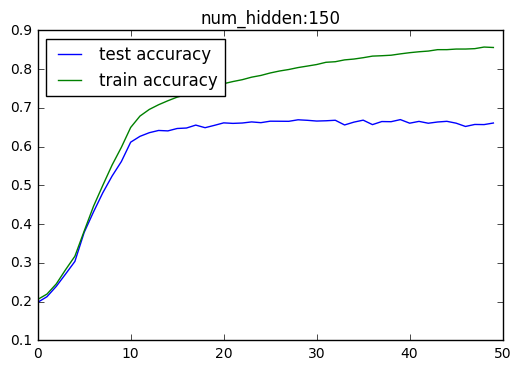

Train max accuracy:0.857
Test max accuracy:0.670


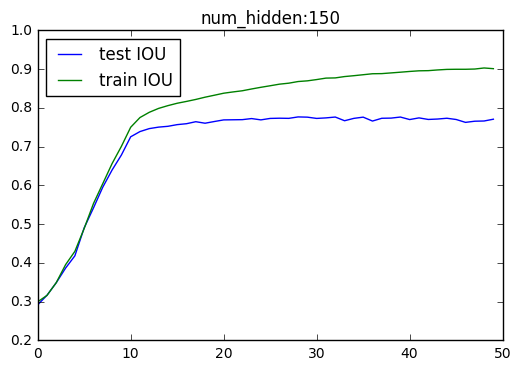

Train max IOU:0.903
Test max IOU:0.777


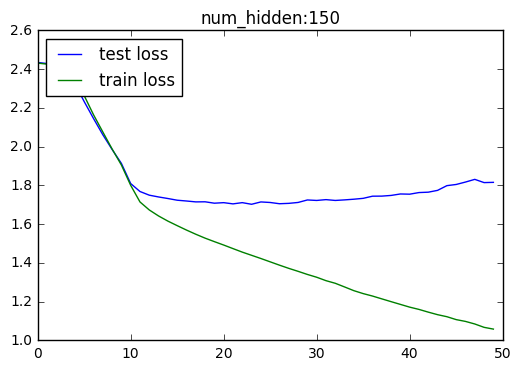

Train min loss:1.059
Test min loss:1.703
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


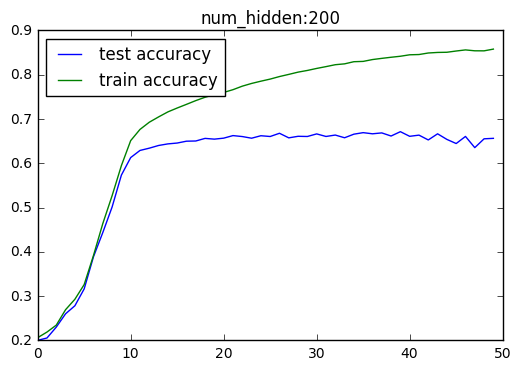

Train max accuracy:0.858
Test max accuracy:0.671


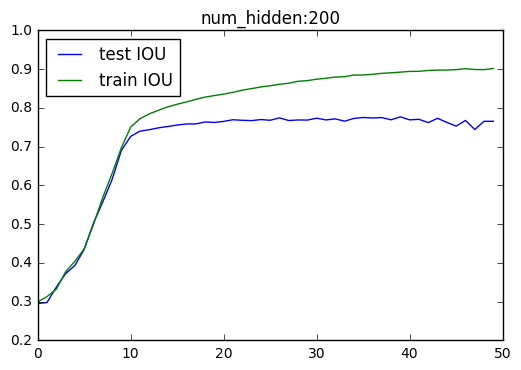

Train max IOU:0.902
Test max IOU:0.777


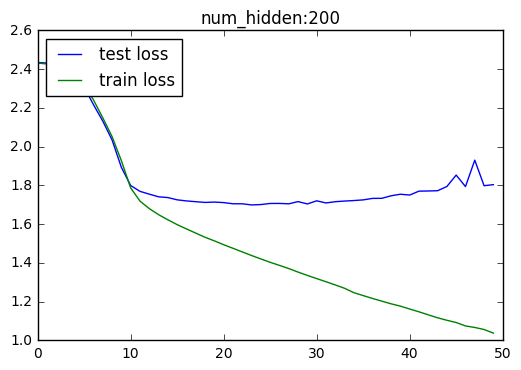

Train min loss:1.038
Test min loss:1.699
---------------------------------------------------------------------------------------------------- 



In [21]:
stats(test=imSc_test_res, train=imSc_train_res, ephocs=50)

#### STD = 0.067

In [17]:
imSc15_test_res, imSc15_train_res = [], []

for num_hidden in [50, 100, 150, 200]:
    params_dir = params_dir_tmp+'base/imSc15_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=False
    )


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0,
            imScale=True)
    
    imSc15_test_res.append(tst)
    imSc15_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

params_dir: ../data/training/models/All/base/imSc15_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 1.885 ;acc: 0.240 ;iou: 0.360 ;time: 0:00:01
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 2.160 ;acc: 0.225 ;iou: 0.310 ;time: 0:00:07
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 1.898 ;acc: 0.245 ;iou: 0.335 ;time: 0:00:14
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 1.567 ;acc: 0.330 ;iou: 0.430 ;time: 0:00:21
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 3.661 ;acc: 0.080 ;iou: 0.200 ;time: 0:00:28
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 3.542 ;acc: 0.040 ;iou: 0.090 ;time: 0:00:35

*Training B: True ;B Train loss: 2.431 ;Train accuracy: 0.197 ;IOU accuracy: 0.286 ;Time: 0:00:41 

Testin

In [18]:
np.save(open('../data/training/results/imSc15_train_res.bin', 'wb'), imSc15_train_res)
np.save(open('../data/training/results/imSc15_test_res.bin', 'wb'), imSc15_test_res)

num_hidden: 50


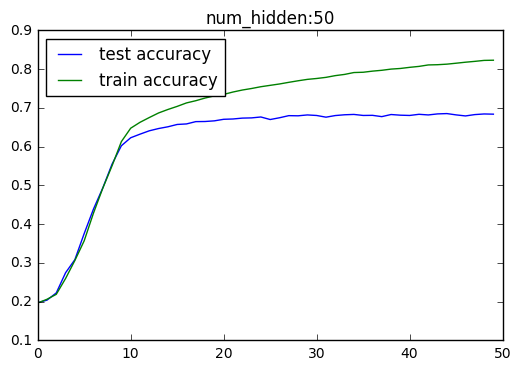

Train max accuracy:0.823
Test max accuracy:0.685


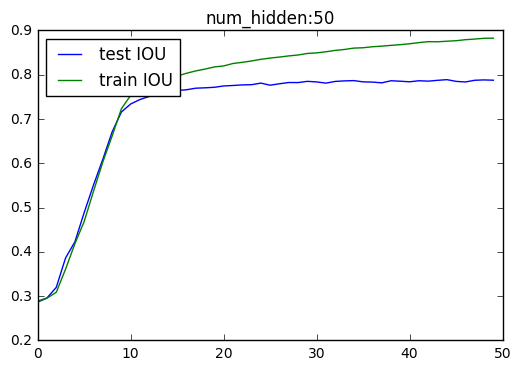

Train max IOU:0.883
Test max IOU:0.789


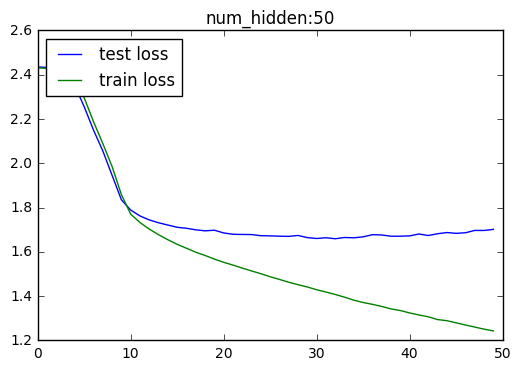

Train min loss:1.243
Test min loss:1.659
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


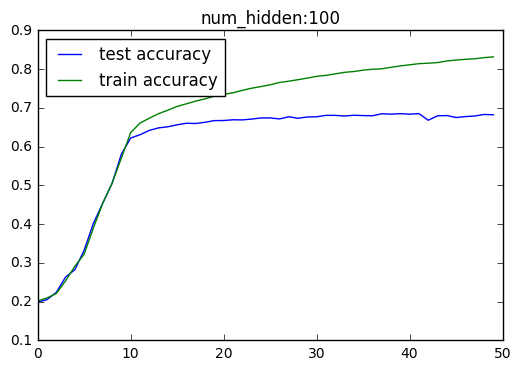

Train max accuracy:0.832
Test max accuracy:0.685


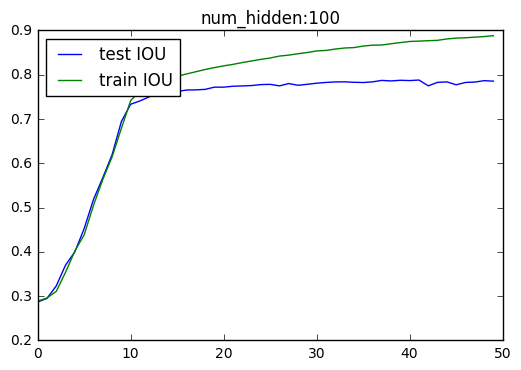

Train max IOU:0.888
Test max IOU:0.788


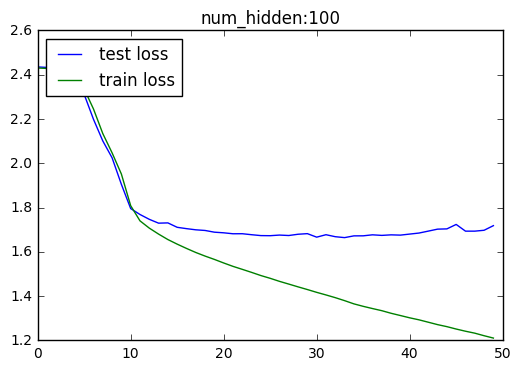

Train min loss:1.211
Test min loss:1.664
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


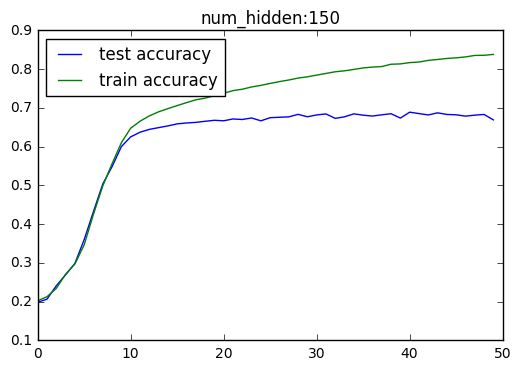

Train max accuracy:0.838
Test max accuracy:0.689


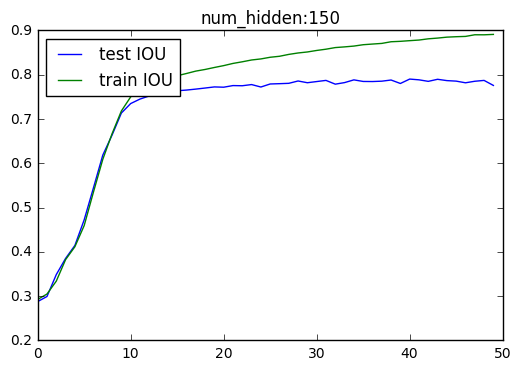

Train max IOU:0.891
Test max IOU:0.790


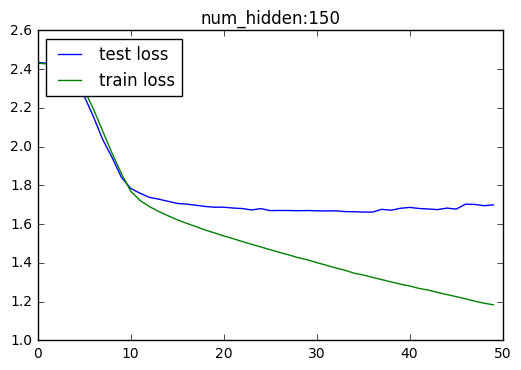

Train min loss:1.184
Test min loss:1.663
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


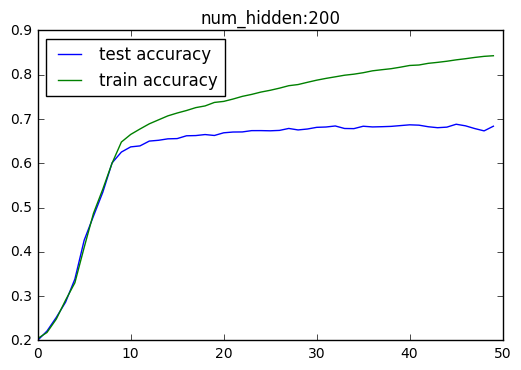

Train max accuracy:0.843
Test max accuracy:0.688


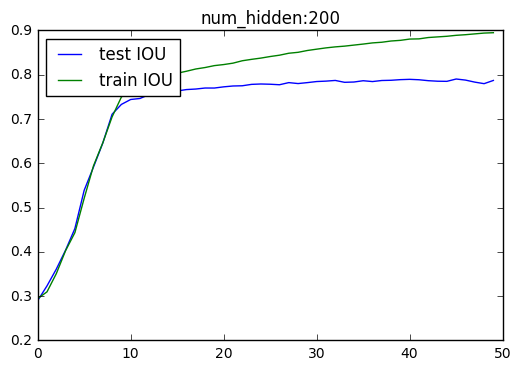

Train max IOU:0.895
Test max IOU:0.790


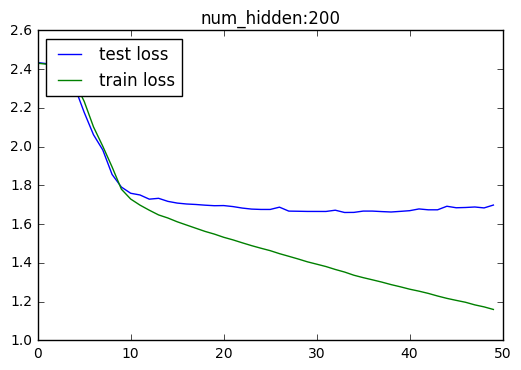

Train min loss:1.160
Test min loss:1.660
---------------------------------------------------------------------------------------------------- 



In [19]:
stats(test=imSc15_test_res, train=imSc15_train_res, ephocs=50)

In [23]:
imSc20_test_res, imSc20_train_res = [], []

for num_hidden in [50, 100, 150, 200]:
    params_dir = params_dir_tmp+'base/imSc20_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=False
    )


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0,
            imScale=True)
    
    imSc20_test_res.append(tst)
    imSc20_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

params_dir: ../data/training/models/All/base/imSc20_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 1.545 ;acc: 0.330 ;iou: 0.430 ;time: 0:00:00
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 2.701 ;acc: 0.120 ;iou: 0.185 ;time: 0:00:07
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 1.835 ;acc: 0.200 ;iou: 0.260 ;time: 0:00:15
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 3.570 ;acc: 0.060 ;iou: 0.210 ;time: 0:00:22
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 2.115 ;acc: 0.165 ;iou: 0.240 ;time: 0:00:29
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 2.834 ;acc: 0.100 ;iou: 0.225 ;time: 0:00:36

*Training B: True ;B Train loss: 2.431 ;Train accuracy: 0.201 ;IOU accuracy: 0.290 ;Time: 0:00:42 

Testin

In [24]:
np.save(open('../data/training/results/imSc20_train_res.bin', 'wb'), imSc20_train_res)
np.save(open('../data/training/results/imSc20_test_res.bin', 'wb'), imSc20_test_res)

num_hidden: 50


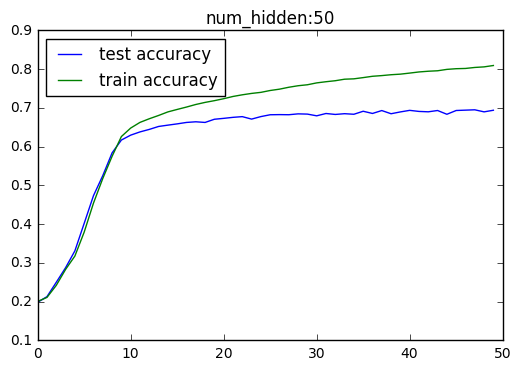

Train max accuracy:0.810
Test max accuracy:0.695


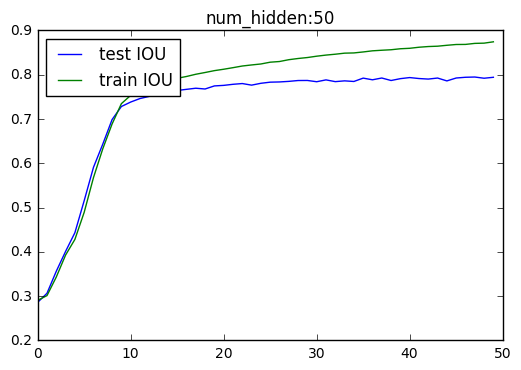

Train max IOU:0.874
Test max IOU:0.795


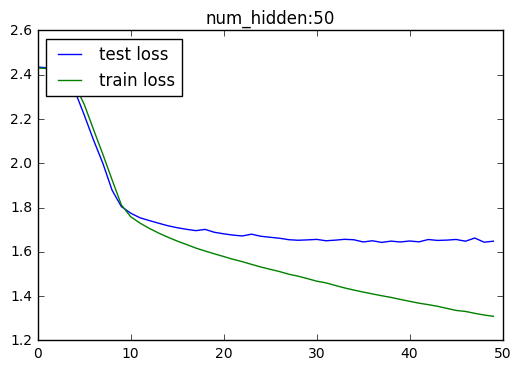

Train min loss:1.309
Test min loss:1.643
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


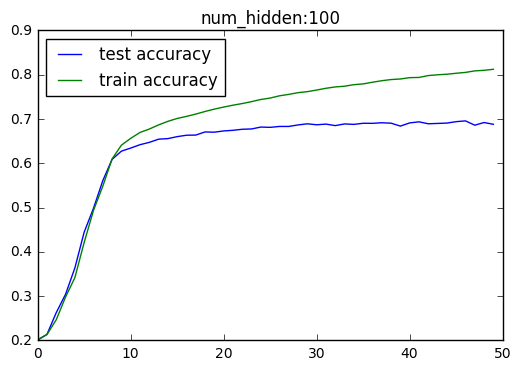

Train max accuracy:0.812
Test max accuracy:0.696


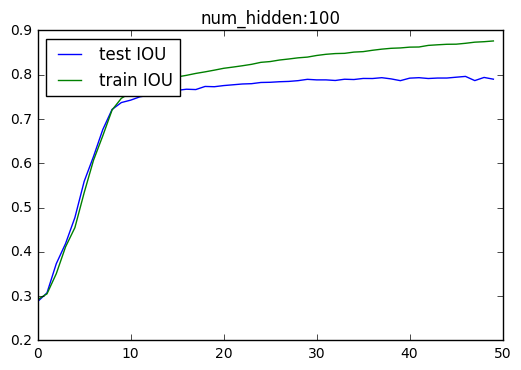

Train max IOU:0.876
Test max IOU:0.796


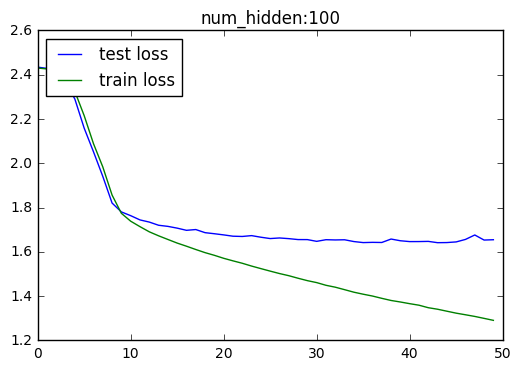

Train min loss:1.291
Test min loss:1.642
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


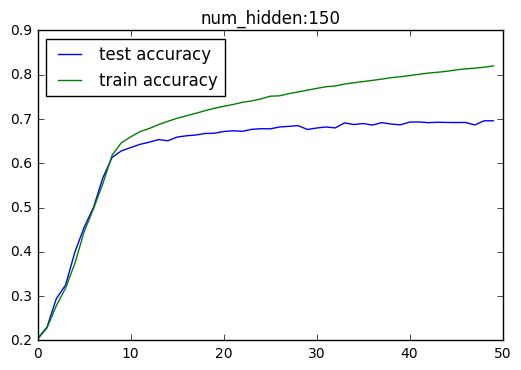

Train max accuracy:0.820
Test max accuracy:0.696


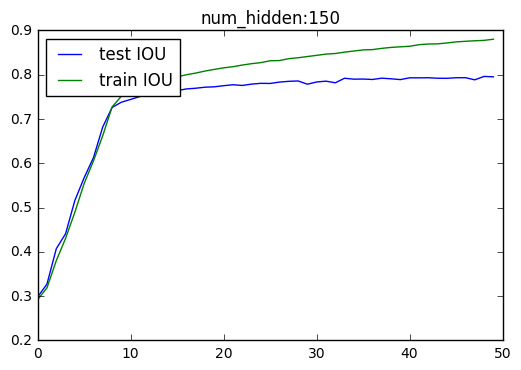

Train max IOU:0.880
Test max IOU:0.796


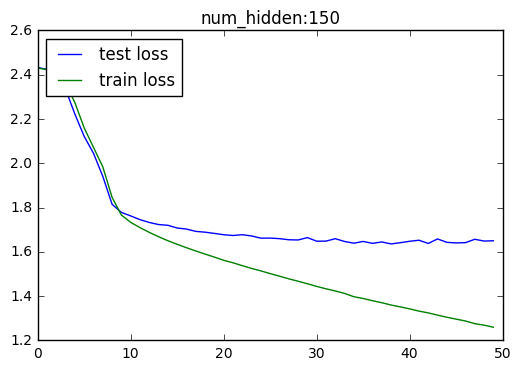

Train min loss:1.260
Test min loss:1.636
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


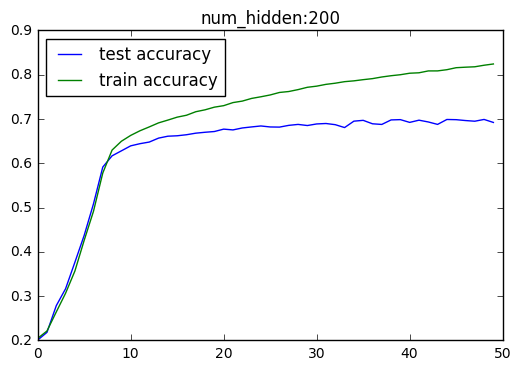

Train max accuracy:0.824
Test max accuracy:0.699


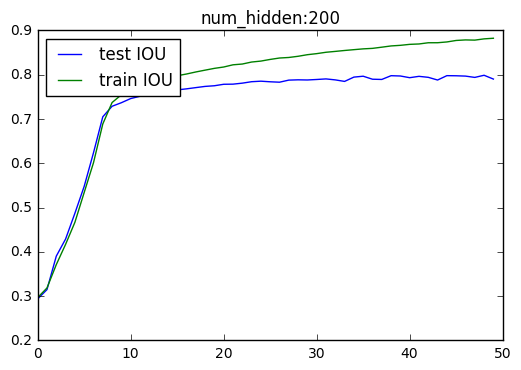

Train max IOU:0.882
Test max IOU:0.799


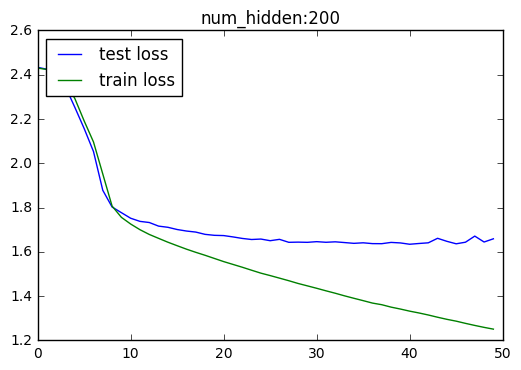

Train min loss:1.251
Test min loss:1.634
---------------------------------------------------------------------------------------------------- 



In [25]:
stats(test=imSc20_test_res, train=imSc20_train_res, ephocs=50)

#### STD=0.034

In [28]:
imSc30_test_res, imSc30_train_res = [], []

for num_hidden in [50, 100, 150, 200]:
    params_dir = params_dir_tmp+'base/imSc30_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=False
    )


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0,
            imScale=True)
    
    imSc30_test_res.append(tst)
    imSc30_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

params_dir: ../data/training/models/All/base/imSc30_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 2.163 ;acc: 0.185 ;iou: 0.295 ;time: 0:00:00
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 3.049 ;acc: 0.090 ;iou: 0.170 ;time: 0:00:07
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 1.528 ;acc: 0.370 ;iou: 0.485 ;time: 0:00:14
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 3.932 ;acc: 0.040 ;iou: 0.110 ;time: 0:00:20
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 2.701 ;acc: 0.145 ;iou: 0.225 ;time: 0:00:27
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 1.575 ;acc: 0.390 ;iou: 0.470 ;time: 0:00:33

*Training B: True ;B Train loss: 2.430 ;Train accuracy: 0.202 ;IOU accuracy: 0.287 ;Time: 0:00:40 

Testin

In [29]:
np.save(open('../data/training/results/imSc30_train_res.bin', 'wb'), imSc30_train_res)
np.save(open('../data/training/results/imSc30_test_res.bin', 'wb'), imSc30_test_res)

num_hidden: 50


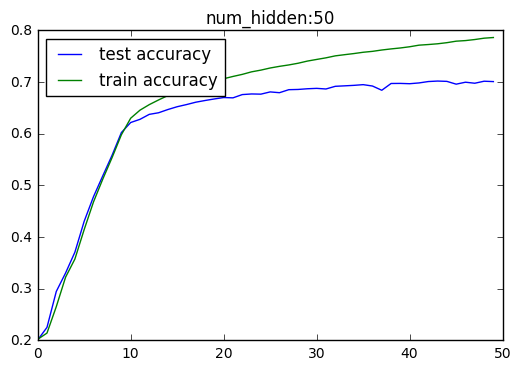

Train max accuracy:0.786
Test max accuracy:0.702


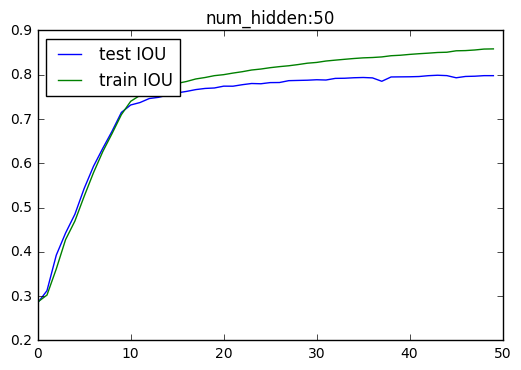

Train max IOU:0.858
Test max IOU:0.799


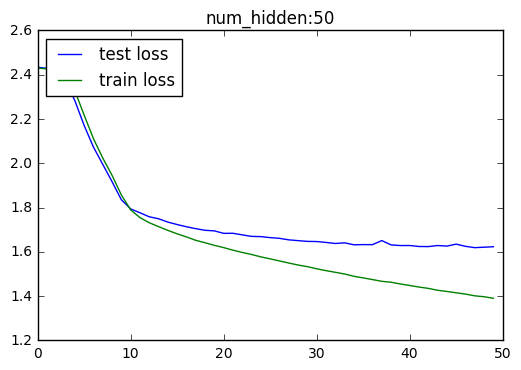

Train min loss:1.390
Test min loss:1.619
---------------------------------------------------------------------------------------------------- 

num_hidden: 100


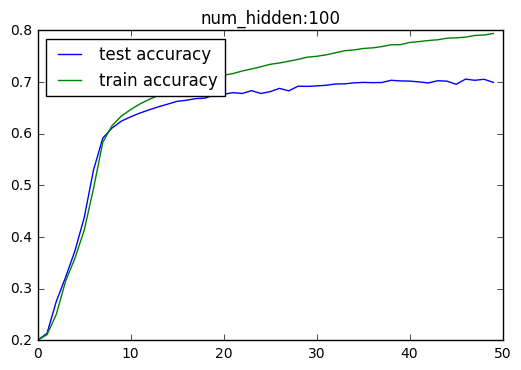

Train max accuracy:0.794
Test max accuracy:0.706


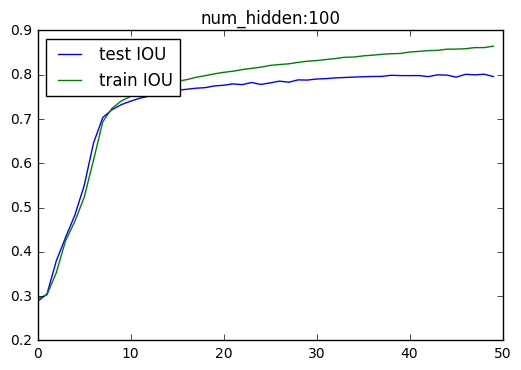

Train max IOU:0.865
Test max IOU:0.801


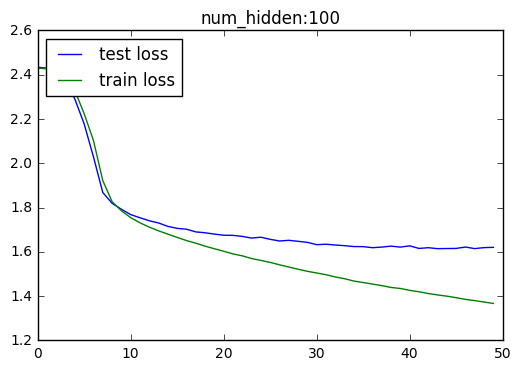

Train min loss:1.367
Test min loss:1.615
---------------------------------------------------------------------------------------------------- 

num_hidden: 150


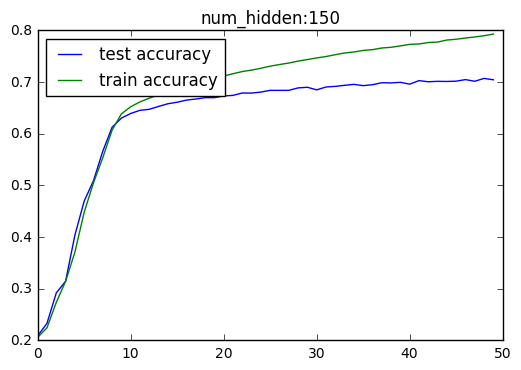

Train max accuracy:0.793
Test max accuracy:0.707


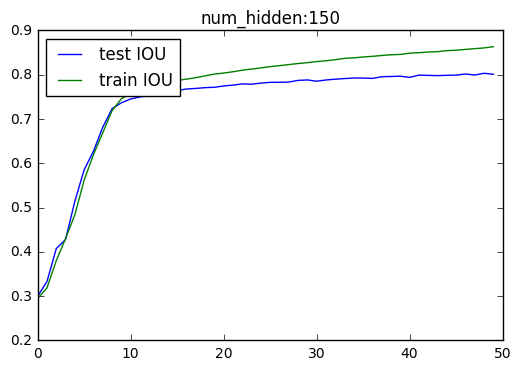

Train max IOU:0.863
Test max IOU:0.803


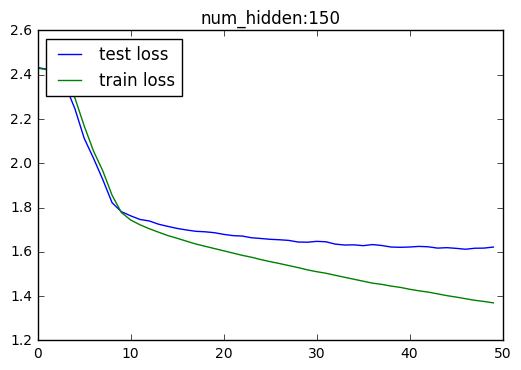

Train min loss:1.370
Test min loss:1.612
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


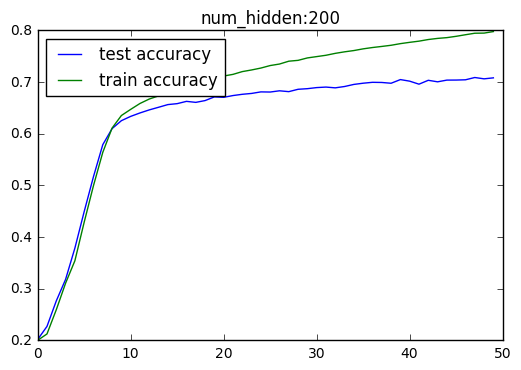

Train max accuracy:0.798
Test max accuracy:0.709


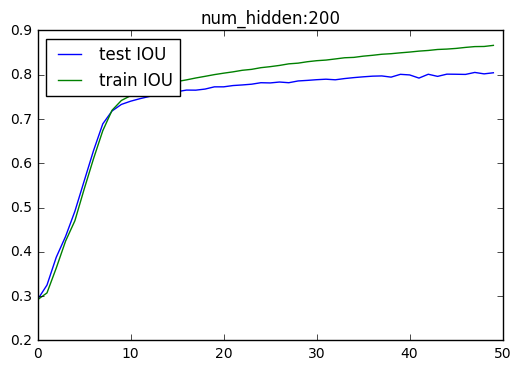

Train max IOU:0.866
Test max IOU:0.805


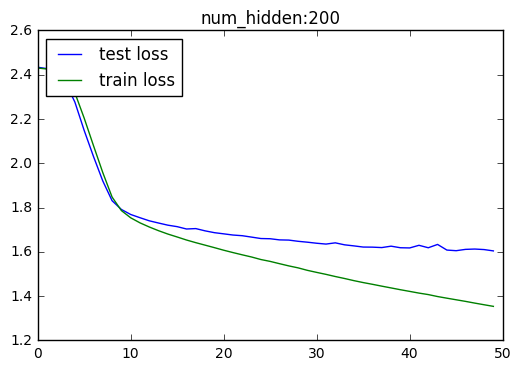

Train min loss:1.354
Test min loss:1.604
---------------------------------------------------------------------------------------------------- 



In [30]:
stats(test=imSc30_test_res, train=imSc30_train_res, ephocs=50)

#### STD=0.025

In [38]:
imSc40_test_res, imSc40_train_res = [], []

for num_hidden in [150, 200]:
    params_dir = params_dir_tmp+'base/imSc40_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=False
    )


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0,
            imScale=True)
    
    imSc40_test_res.append(tst)
    imSc40_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

params_dir: ../data/training/models/All/base/imSc40_hidden:150
num_hidden: 150
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 3.622 ;acc: 0.035 ;iou: 0.135 ;time: 0:00:00
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 2.710 ;acc: 0.175 ;iou: 0.260 ;time: 0:00:09
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 2.800 ;acc: 0.140 ;iou: 0.255 ;time: 0:00:16
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 2.389 ;acc: 0.195 ;iou: 0.270 ;time: 0:00:24
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 1.874 ;acc: 0.220 ;iou: 0.300 ;time: 0:00:32
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 2.687 ;acc: 0.150 ;iou: 0.275 ;time: 0:00:40

*Training B: True ;B Train loss: 2.430 ;Train accuracy: 0.201 ;IOU accuracy: 0.289 ;Time: 0:00:50 

Test

In [39]:
np.save(open('../data/training/results/imSc40_train_res.bin', 'wb'), imSc40_train_res)
np.save(open('../data/training/results/imSc40_test_res.bin', 'wb'), imSc40_test_res)

num_hidden: 150


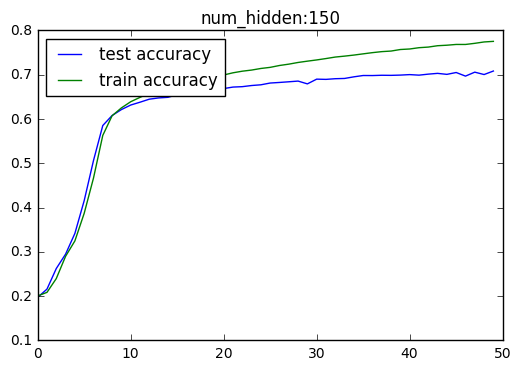

Train max accuracy:0.775
Test max accuracy:0.708


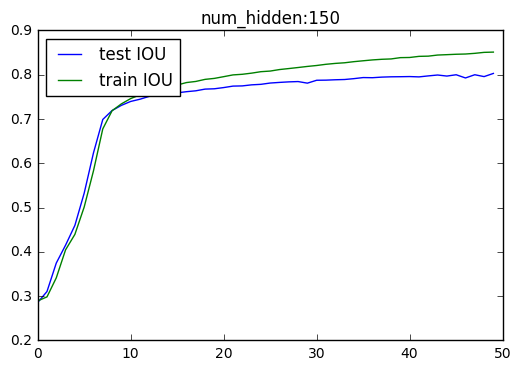

Train max IOU:0.851
Test max IOU:0.803


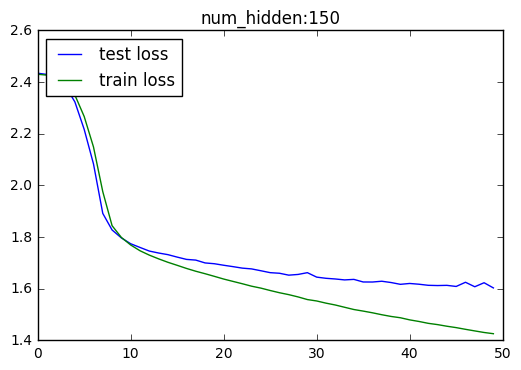

Train min loss:1.426
Test min loss:1.603
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


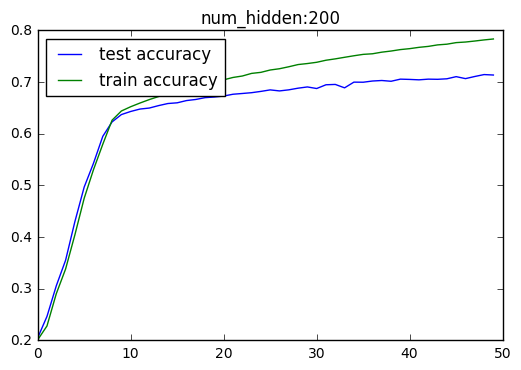

Train max accuracy:0.783
Test max accuracy:0.715


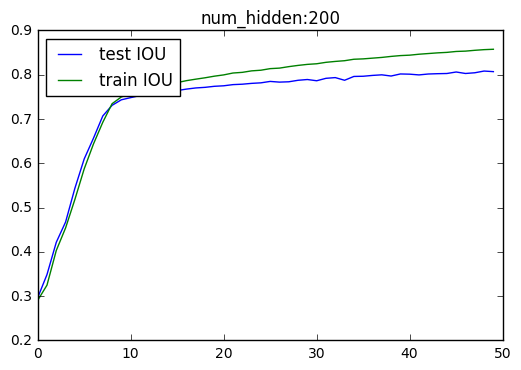

Train max IOU:0.858
Test max IOU:0.808


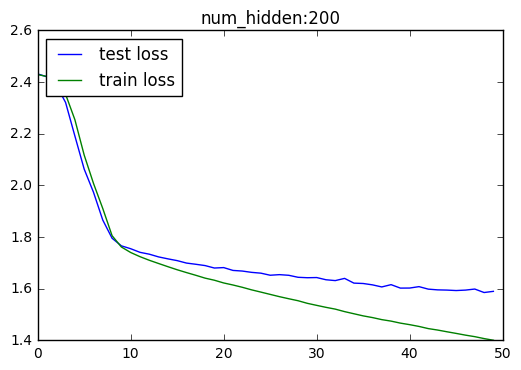

Train min loss:1.401
Test min loss:1.586
---------------------------------------------------------------------------------------------------- 



In [43]:
stats(test=imSc40_test_res, train=imSc40_train_res, ephocs=50, params=[150, 200])

#### Since now the model is mush more stable and it seems we don't get to convergence we run for 100 ephocs and test STD drom 1/30 to 1/100

In [52]:
imScAll_test_res, imScAll_train_res = [], []
num_hidden=200

for imScale in range(30,110,10):
    params_dir = params_dir_tmp+'base/imScAll_'+str(imScale)+'_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        edit_reward=0.,
        rnn_editProb=0.,
        coefAlr=1,
        bnorm=False
    )


    # start comp
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    print('imScale:', imScale)
    tst, trn = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=0, 
            activateAProb=0,
            max_activateAProb=0,
            editProb=0,
            edit_reward=0,
            imScale=imScale)
    
    imScAll_test_res.append(tst)
    imScAll_train_res.append(trn)
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

params_dir: ../data/training/models/All/base/imScAll_30_hidden:200
num_hidden: 200
learning rate: 0.05
imScale: 30
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0500 ;B loss: 2.302 ;acc: 0.130 ;iou: 0.225 ;time: 0:00:01
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0500 ;B loss: 2.576 ;acc: 0.125 ;iou: 0.195 ;time: 0:00:07
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0500 ;B loss: 1.589 ;acc: 0.275 ;iou: 0.360 ;time: 0:00:14
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0500 ;B loss: 2.718 ;acc: 0.180 ;iou: 0.270 ;time: 0:00:20
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0500 ;B loss: 2.402 ;acc: 0.150 ;iou: 0.215 ;time: 0:00:26
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0500 ;B loss: 3.641 ;acc: 0.055 ;iou: 0.185 ;time: 0:00:33

*Training B: True ;B Train loss: 2.430 ;Train accuracy: 0.201 ;IOU accuracy: 0.287 ;Time

In [53]:
np.save(open('../data/training/results/imScAll_train_res.bin', 'wb'), imScAll_train_res)
np.save(open('../data/training/results/imScAll_test_res.bin', 'wb'), imScAll_test_res)

num_hidden: 200


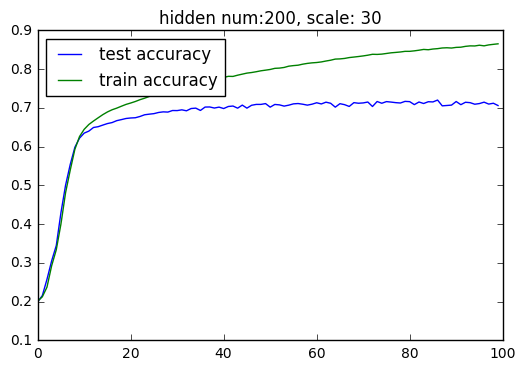

Train max accuracy:0.865
Test max accuracy:0.720


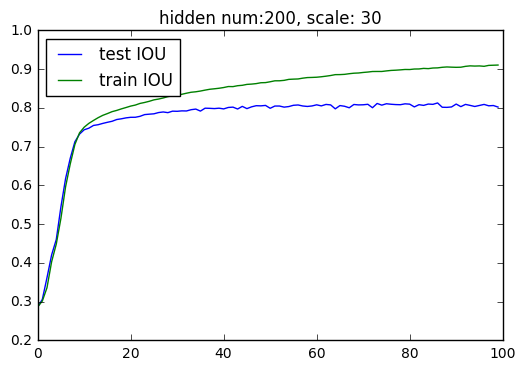

Train max IOU:0.911
Test max IOU:0.813


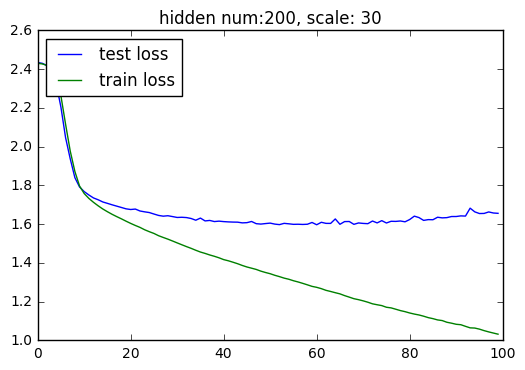

Train min loss:1.032
Test min loss:1.597
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


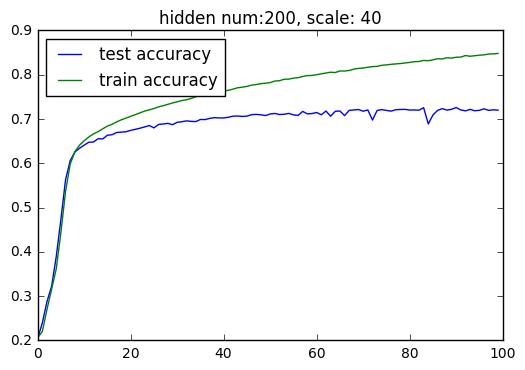

Train max accuracy:0.848
Test max accuracy:0.726


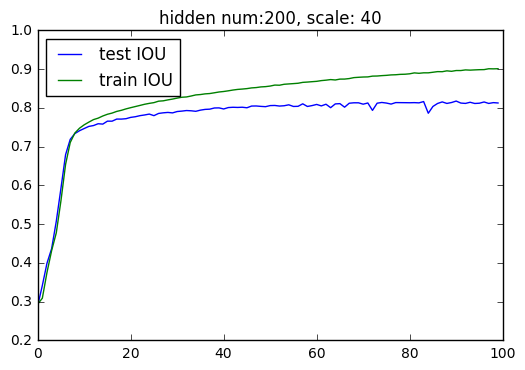

Train max IOU:0.901
Test max IOU:0.818


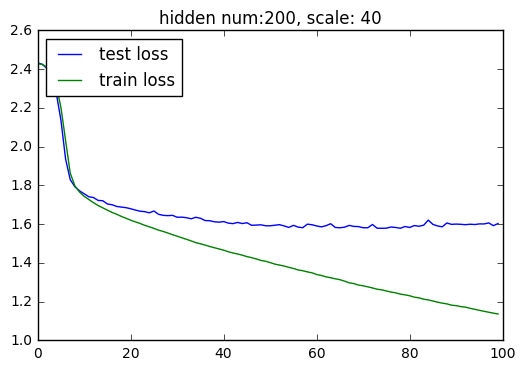

Train min loss:1.137
Test min loss:1.579
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


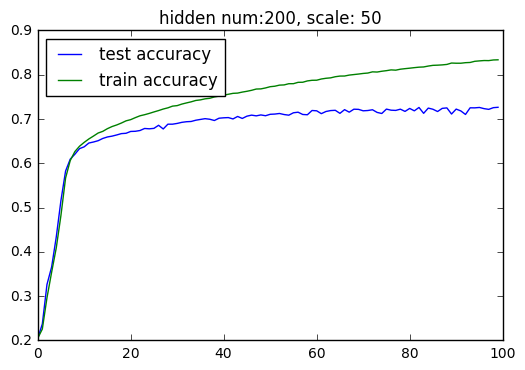

Train max accuracy:0.834
Test max accuracy:0.726


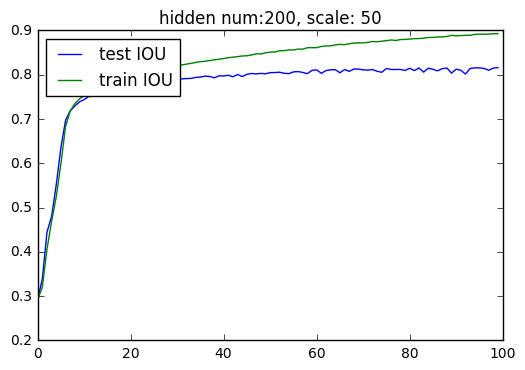

Train max IOU:0.893
Test max IOU:0.816


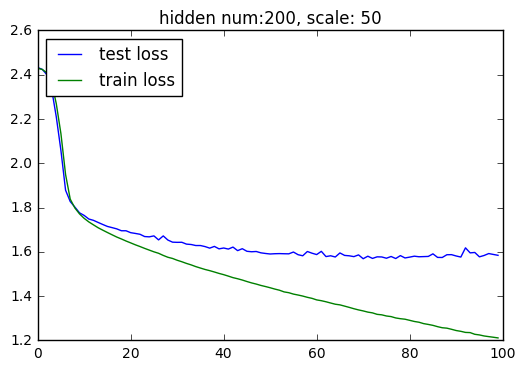

Train min loss:1.211
Test min loss:1.569
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


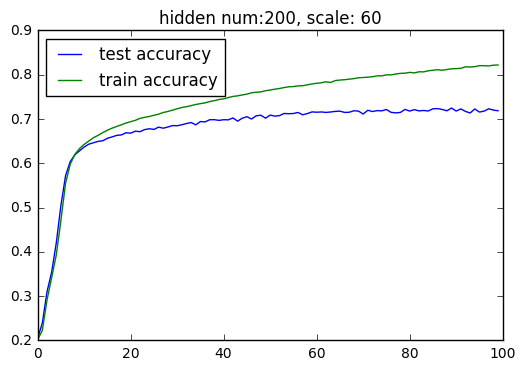

Train max accuracy:0.822
Test max accuracy:0.725


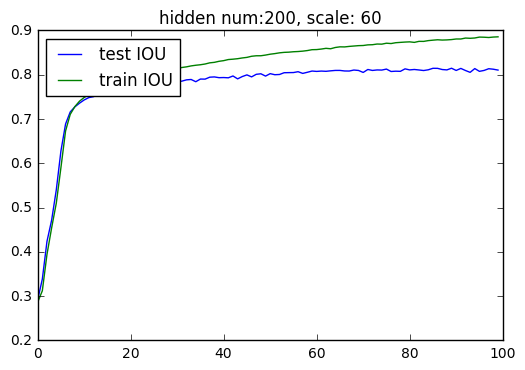

Train max IOU:0.886
Test max IOU:0.815


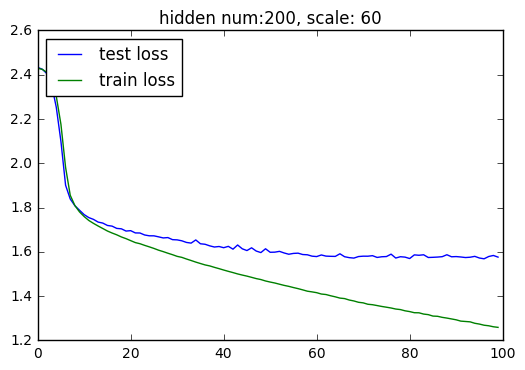

Train min loss:1.259
Test min loss:1.569
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


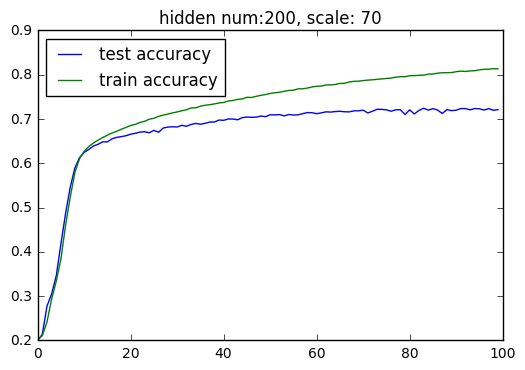

Train max accuracy:0.814
Test max accuracy:0.724


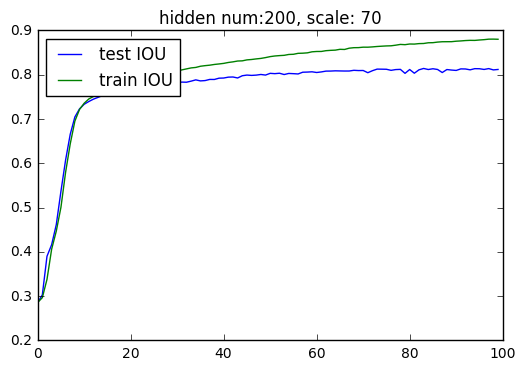

Train max IOU:0.880
Test max IOU:0.814


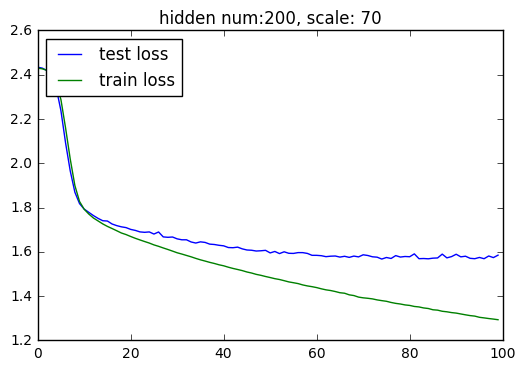

Train min loss:1.294
Test min loss:1.568
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


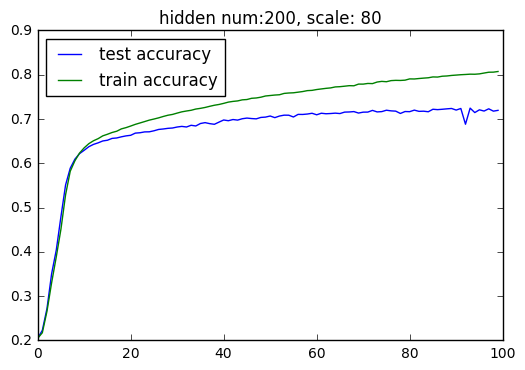

Train max accuracy:0.807
Test max accuracy:0.725


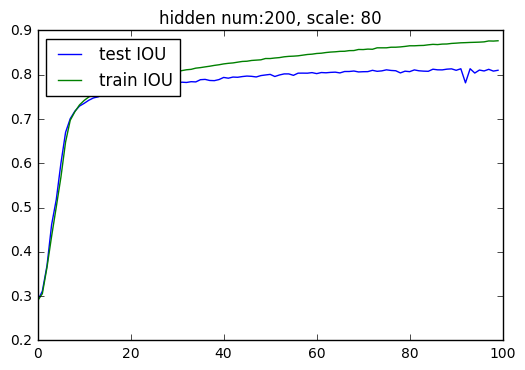

Train max IOU:0.877
Test max IOU:0.814


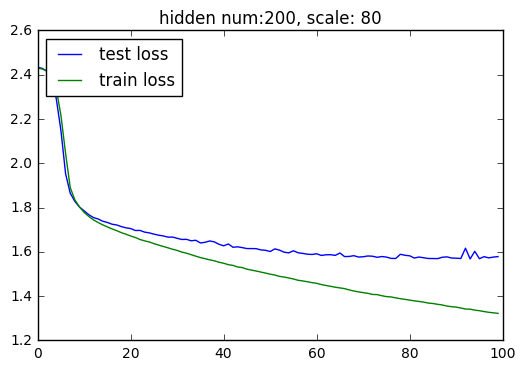

Train min loss:1.322
Test min loss:1.568
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


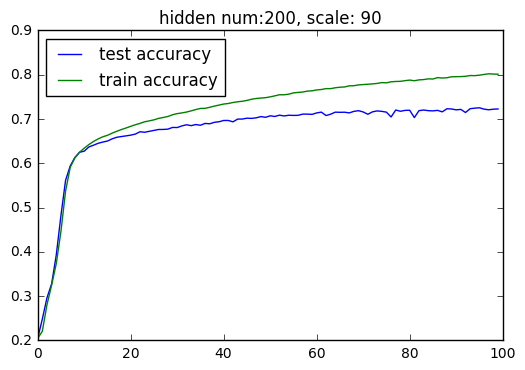

Train max accuracy:0.802
Test max accuracy:0.725


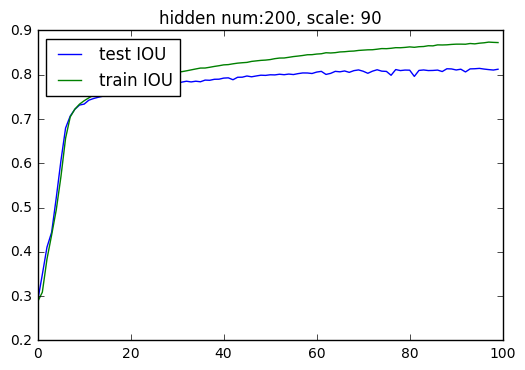

Train max IOU:0.874
Test max IOU:0.814


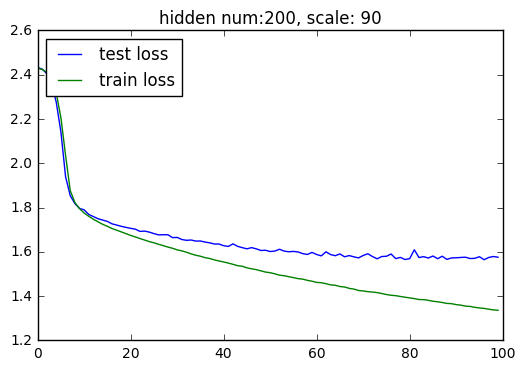

Train min loss:1.336
Test min loss:1.565
---------------------------------------------------------------------------------------------------- 

num_hidden: 200


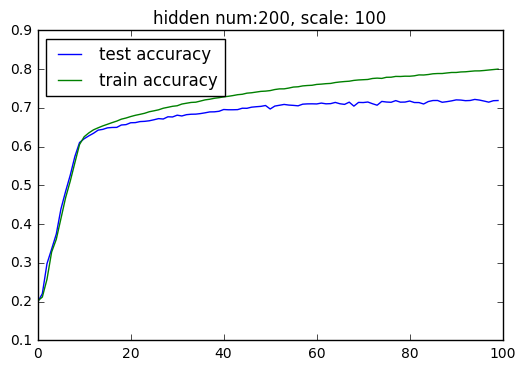

Train max accuracy:0.800
Test max accuracy:0.722


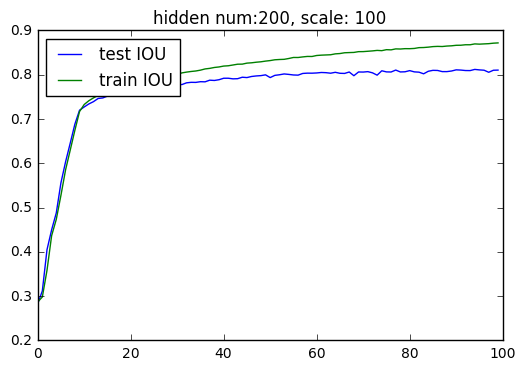

Train max IOU:0.872
Test max IOU:0.812


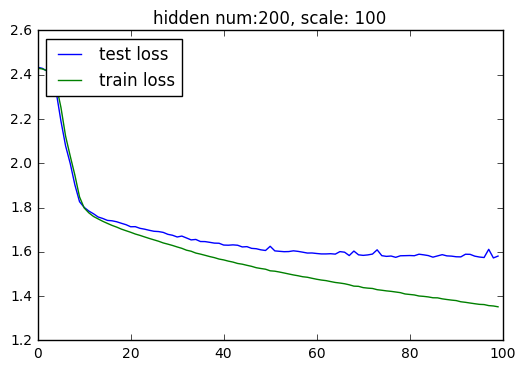

Train min loss:1.352
Test min loss:1.573
---------------------------------------------------------------------------------------------------- 



In [60]:
stats(test=imScAll_test_res, train=imScAll_train_res, ephocs=100, params=range(30,110,10), title='hidden num:200, scale')

## *Dropout

In [15]:
#dropout_in : dropout ratio for the RNN's inputs
#dropout_out : dropout ratio for the RNN's outputs

imSc_dout_test_res, imSc_dout_train_res = [], []
num_hidden = 200
dropout_q = 1.
dropout_im = 0.5

params_dir = params_dir_tmp+'base/imSc_dout_'+str(dropout_im)+','+str(dropout_q)+'_hidden:'+str(num_hidden)
tf.reset_default_graph()
m = Model(
    batch_size=num_hidden, 
    num_hidden=num_hidden,
    embed_size=embed_vecs.shape[1],
    img_dims=trainset[0][0][1][0].shape[1], 
    bbox_dims=trainset[0][0][1][1].shape[1], 
    lr=.02,
    vocab=vocab, 
    decay_steps=5000, 
    decay_rate=0.99, 
    edit_reward=0.,
    rnn_editProb=0.,
    coefAlr=1,
    bnorm=False)


# start comp
print('params_dir:', params_dir)
print('num_hidden:', m.num_hidden)
print('learning rate:', m.lr)
tst, trn = m.train(trainset, testset,
        ephocs_num=100,
        start_ephoc=0,
        startA=101,
        activation_ephoc=101,
        muteB=0, 
        activateAProb=0,
        max_activateAProb=0,
        editProb=0,
        edit_reward=0,
        dropout_in=1.,
        dropout_out=0.5,
        dropout_img=dropout_im,
        dropout_q=dropout_q,
        imScale=50)

imSc_dout_test_res.append(tst)
imSc_dout_train_res.append(trn)
print('\n'+'*'*100)
print('*'*100)
print('*'*100,'\n')

params_dir: ../data/training/models/All/base/imSc_dout_0.5,1.0_hidden:200
num_hidden: 200
learning rate: 0.02
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0200 ;B loss: 2.891 ;acc: 0.120 ;iou: 0.190 ;time: 0:00:01
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0200 ;B loss: 1.388 ;acc: 0.535 ;iou: 0.690 ;time: 0:00:16
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0200 ;B loss: 2.164 ;acc: 0.190 ;iou: 0.265 ;time: 0:00:34
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0200 ;B loss: 1.538 ;acc: 0.315 ;iou: 0.435 ;time: 0:00:42
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0200 ;B loss: 1.919 ;acc: 0.250 ;iou: 0.325 ;time: 0:00:53
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0200 ;B loss: 2.589 ;acc: 0.160 ;iou: 0.210 ;time: 0:01:02

*Training B: True ;B Train loss: 2.431 ;Train accuracy: 0.199 ;IOU accuracy: 0.285 ;Time: 0:0

In [147]:
np.save(open('../data/training/results/imSc_dout_test_res.bin', 'wb'), imSc_dout_test_res)
np.save(open('../data/training/results/imSc_dout_train_res.bin', 'wb'), imSc_dout_train_res)

In [ ]:
#dropout_in : dropout ratio for the RNN's inputs
#dropout_out : dropout ratio for the RNN's outputs
bnorm_imSc_dout_test_res, bnorm_imSc_dout_train_res = [], []

num_hidden = 200
dropout_q = 1.
dropout_im = 0.5

params_dir = params_dir_tmp+'bnorm_base/imSc_dout_'+str(dropout_im)+','+str(dropout_q)+'_hidden:'+str(num_hidden)
tf.reset_default_graph()
m = Model(
    batch_size=num_hidden, 
    num_hidden=num_hidden,
    embed_size=embed_vecs.shape[1],
    img_dims=trainset[0][0][1][0].shape[1], 
    bbox_dims=trainset[0][0][1][1].shape[1], 
    lr=.02,
    vocab=vocab, 
    decay_steps=5000, 
    decay_rate=0.99, 
    edit_reward=0.,
    rnn_editProb=0.,
    coefAlr=1,
    bnorm=True)


# start comp
print('params_dir:', params_dir)
print('num_hidden:', m.num_hidden)
print('learning rate:', m.lr)
tst, trn = m.train(trainset, testset,
        ephocs_num=100,
        start_ephoc=0,
        startA=101,
        activation_ephoc=101,
        muteB=0, 
        activateAProb=0,
        max_activateAProb=0,
        editProb=0,
        edit_reward=0,
        dropout_in=1.,
        dropout_out=0.5,
        dropout_img=dropout_im,
        dropout_q=dropout_q,
        imScale=50)

bnorm_imSc_dout_test_res.append(tst)
bnorm_imSc_dout_train_res.append(trn)
print('\n'+'*'*100)
print('*'*100)
print('*'*100,'\n')

params_dir: ../data/training/models/All/bnorm_base/imSc_dout_0.5,1.0_hidden:200
num_hidden: 200
learning rate: 0.02
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit: False ;A: False ;batch: 0 ;gs: 1 ;lr: 0.0200 ;B loss: 1.495 ;acc: 0.440 ;iou: 0.580 ;time: 0:00:00
Edit: False ;A: False ;batch: 50 ;gs: 51 ;lr: 0.0200 ;B loss: 2.569 ;acc: 0.160 ;iou: 0.245 ;time: 0:00:07
Edit: False ;A: False ;batch: 100 ;gs: 101 ;lr: 0.0200 ;B loss: 2.935 ;acc: 0.115 ;iou: 0.230 ;time: 0:00:15
Edit: False ;A: False ;batch: 150 ;gs: 151 ;lr: 0.0200 ;B loss: 1.627 ;acc: 0.380 ;iou: 0.510 ;time: 0:00:23
Edit: False ;A: False ;batch: 200 ;gs: 201 ;lr: 0.0200 ;B loss: 3.261 ;acc: 0.105 ;iou: 0.205 ;time: 0:00:31
Edit: False ;A: False ;batch: 250 ;gs: 251 ;lr: 0.0200 ;B loss: 2.641 ;acc: 0.205 ;iou: 0.265 ;time: 0:00:39

*Training B: True ;B Train loss: 2.437 ;Train accuracy: 0.210 ;IOU accuracy: 0.305 ;Tim